# Customer Churn

Your goal is to find a binary classifier to predict customer churn. Specifically, use the label ***Churn Value*** in the file **Telco_customer_churn_practice.csv** where 1 indicates the customer churns, otherwise 0. 


In [1]:
# To restart the session, clear the cache and start afresh!
try:
    from IPython import get_ipython
    get_ipython().magic('clear')
    get_ipython().magic('reset -f')
except:
    pass



In [2]:
###################################################
#  Use one or more cells for your implementation  #
###################################################
import os # To set directory
import pandas as pd
pd.options.display.max_columns = None
from ipywidgets import widgets
from sklearn.model_selection import train_test_split # Data Splitting
from sklearn.preprocessing import scale # For Scaling
from sklearn.preprocessing import minmax_scale # For Scaling
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report 
from pandas_profiling import ProfileReport #Import pandas_profiling for EDA
import sweetviz as sv #Import Sweetviz for EDA
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns 
from scipy.stats import boxcox
from scipy.stats import skew

In [4]:
os.chdir(r'/777 partners') #Set up the current working directory

# 2. Import data,  preprocessing, and feature selection etc
 Provided file: `Telco_customer_churn_practice.csv`.
 

In [10]:
###################################################
#  Use one or more cells for your implementation  #
###################################################


Steps:
- Step 1: Data Collection
- Step 2: Feature Engineering 
- Step 3: Exploratory Data Analysis (EDA)
- Step 4: Train/Test Split
- Step 5: Model Development


Step 1: Data Collection

- 1.1 Importing Data

In [5]:
df = pd.read_csv('Telco_customer_churn_practice.csv')
df.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1


1.2 Data Exploration

In [12]:
df.columns
df.describe()
df.dtypes

CustomerID            object
Count                  int64
Country               object
State                 object
City                  object
Zip Code               int64
Lat Long              object
Latitude             float64
Longitude            float64
Gender                object
Senior Citizen        object
Partner               object
Dependents            object
Tenure Months          int64
Phone Service         object
Multiple Lines        object
Internet Service      object
Online Security       object
Online Backup         object
Device Protection     object
Tech Support          object
Streaming TV          object
Streaming Movies      object
Contract              object
Paperless Billing     object
Payment Method        object
Monthly Charges      float64
Total Charges         object
Churn Value            int64
dtype: object

In [6]:
# Convert the data type of Total Charges  
df['Total Charges'] = df['Total Charges'].replace(r'\s+', np.nan, regex=True)
df['Total Charges'] = pd.to_numeric(df['Total Charges'])

In [7]:
df.isnull().sum(axis = 0)

CustomerID            0
Count                 0
Country               0
State                 0
City                  0
Zip Code              0
Lat Long              0
Latitude              0
Longitude             0
Gender                0
Senior Citizen        0
Partner               0
Dependents            0
Tenure Months         0
Phone Service         0
Multiple Lines        0
Internet Service      0
Online Security       0
Online Backup         0
Device Protection     0
Tech Support          0
Streaming TV          0
Streaming Movies      0
Contract              0
Paperless Billing     0
Payment Method        0
Monthly Charges       0
Total Charges        11
Churn Value           0
dtype: int64

In [8]:
df = df.fillna(value=0)

1.3 Feature Engineering

In [9]:
df['Num_of_services'] =(df[['Online Security','Device Protection','Streaming Movies','Tech Support',
       'Online Backup',   'Streaming TV']] == 'Yes').sum(axis =1)

In [10]:
print("There are {} features and {} observations.".format(df.shape[1], df.shape[0]))

There are 30 features and 7043 observations.


<AxesSubplot:xlabel='count', ylabel='Num_of_services'>

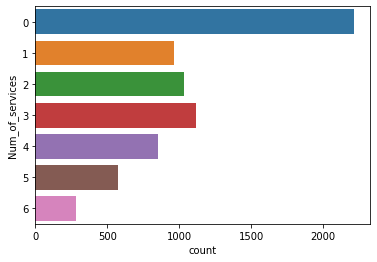

In [11]:
sns.countplot(y = 'Num_of_services' , data = df)

Step 3: EDA

In [12]:
# Generating exploratory report 
# The broadness of analysis and the in-depth univariate analysis using profile_report
pandas_profiling_report = df.profile_report(
    title="Customer Churn Profiling Report", 
    explorative=True,  #More analysis (Unicode)
    html={'style': 
          {'full_width': True,
           'theme':'flatly'} #available theme options: ‘bootswatch’ ,'flatly','united'
        }, 
    interactions = {'targets' : ['Churn Value']} , #When a list of variable names is given, only interactions between these and all other variables are given.
    progress_bar=True)
pandas_profiling_report.to_file("customer_churn_EDA_report.html")

Summarize dataset:   0%|          | 0/43 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

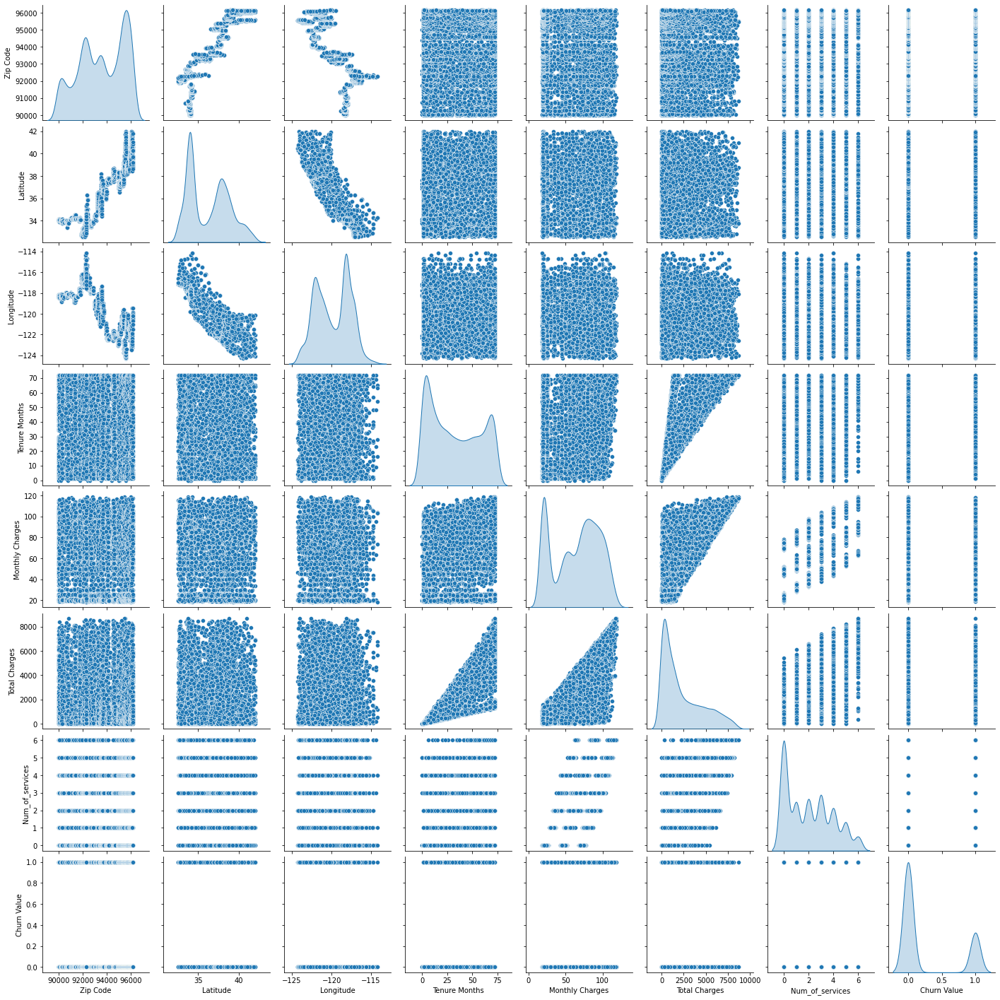

In [20]:
#Separating columns to be visualized
out_cols = list(set(df.nunique()[df.nunique()<6].keys().tolist()
                    + df.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in df.columns if x not in out_cols] + ['Churn Value']

sns.pairplot(df[viz_cols], diag_kind="kde")
plt.show()

## PreProcessing data for machine
Based on the data types and the values, following actions are defined to preprocess/engineer the features for machine readibility and further analysis:

    customerID: not relevant
    
# Columns removed

Zero Variance Columns:

    Count
    Country
    State
 
# Label encoding 
The following features are categorical and each take on 2 values (mostly yes/no) — therefore are transformed to binary integers

    gender
    Partner
    Dependents
    Churn
    PhoneService
    PaperlessBilling
    SeniorCitizen
# One-Hot Encoding 
The following features are categorical, yet not ordinal (no ranking) but take on more than 2 values. For each value, a new variable is created with a binary integer indicating if the value occured in a data entry or not (1 or 0).

    MultipleLines
    InternetService
    OnlineSecurity
    OnlineBackup
    DeviceProtection
    TechSupport
    StreamingTV
    StreamingMovies
    Contract
    PaymentMethod
#  Scaling 
Values of numerical features are rescaled between a range of 0 and 1. scaler is the standard approach for scaling. For normally distributed features standard scaler could be used, which scales values around a mean of 0 and a standard deviation of 1. For simplicity we use min-max scaler for all numerical features.
    
    tenure
    zipcode
    TotalCharges
    MonthlyCharges

In [13]:
# Removing zero variance variables
zero_var = ['Count','Country','State']

df=df.drop(columns = zero_var )

#Remove highly corelated Variables
cor_var = ['Latitude','Longitude','Lat Long']

df=df.drop(columns = cor_var )

print("There are {} features and {} observations.".format(df.shape[1], df.shape[0]))

There are 24 features and 7043 observations.


In [22]:
df.index=df['CustomerID']

In [23]:
df=df.drop(columns='CustomerID')  #Dropping unique variable and high cardinality

In [24]:
num_vars = df.select_dtypes([np.number]).columns
obj_vars = df.select_dtypes([np.object_]).columns
print("Numeric variables: ",num_vars,"\n\n", "Object variables: ",obj_vars)

Numeric variables:  Index(['Zip Code', 'Tenure Months', 'Monthly Charges', 'Total Charges',
       'Churn Value', 'Num_of_services'],
      dtype='object') 

 Object variables:  Index(['City', 'Gender', 'Senior Citizen', 'Partner', 'Dependents',
       'Phone Service', 'Multiple Lines', 'Internet Service',
       'Online Security', 'Online Backup', 'Device Protection', 'Tech Support',
       'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing',
       'Payment Method'],
      dtype='object')


In [25]:
# Transforming skewed variables
numeric_feats = ['Zip Code','Total Charges','Monthly Charges','Num_of_services','Tenure Months']
skewed_cols = df[numeric_feats].apply(lambda x: skew(x.dropna()))
skewed_cols_idx = skewed_cols[skewed_cols > 0.75].index
skewed_cols = df[skewed_cols_idx]+1
df[skewed_cols_idx] = skewed_cols.transform(lambda x: boxcox(x)[0])

In [26]:
skewed_cols

,Total Charges
CustomerID,
3668-QPYBK,109.15
9237-HQITU,152.65
9305-CDSKC,821.50
7892-POOKP,3047.05
0280-XJGEX,5037.30
...,...
2569-WGERO,1420.40
6840-RESVB,1991.50
2234-XADUH,7363.90


In [27]:
#Label Encoding
features_le = ['Partner','Dependents','Phone Service','Paperless Billing','Senior Citizen']
def lable_encoding(features,data):
    for i in features:
        data[i]=data[i].map({'Yes':1,'No':0})
    return

lable_encoding(features_le,df)

df['Gender'] = df['Gender'].map({'Female':1, 'Male':0})

In [28]:
df.dtypes

City                  object
Zip Code               int64
Gender                 int64
Senior Citizen         int64
Partner                int64
Dependents             int64
Tenure Months          int64
Phone Service          int64
Multiple Lines        object
Internet Service      object
Online Security       object
Online Backup         object
Device Protection     object
Tech Support          object
Streaming TV          object
Streaming Movies      object
Contract              object
Paperless Billing      int64
Payment Method        object
Monthly Charges      float64
Total Charges        float64
Churn Value            int64
Num_of_services        int64
dtype: object

In [29]:
#One Hot Encoding
features_ohe =['Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Payment Method','City']
df = pd.get_dummies(df,columns=features_ohe)

In [30]:
# Removing sparse variables
sparse = []

for var in df.columns:
    n_zero = (df[var] == 0).sum()
    if n_zero / len(df) > 0.9594:
        sparse.append(var)

df.drop(columns=sparse, inplace=True)

print("There are {} features and {} observations.".format(df.shape[1], df.shape[0]))

There are 44 features and 7043 observations.


In [31]:
df.isnull().sum(axis = 0)

Zip Code                                    0
Gender                                      0
Senior Citizen                              0
Partner                                     0
Dependents                                  0
Tenure Months                               0
Phone Service                               0
Paperless Billing                           0
Monthly Charges                             0
Total Charges                               0
Churn Value                                 0
Num_of_services                             0
Multiple Lines_No                           0
Multiple Lines_No phone service             0
Multiple Lines_Yes                          0
Internet Service_DSL                        0
Internet Service_Fiber optic                0
Internet Service_No                         0
Online Security_No                          0
Online Security_No internet service         0
Online Security_Yes                         0
Online Backup_No                  

In [32]:
df[['Zip Code','Tenure Months','Monthly Charges','Total Charges','Num_of_services']] = minmax_scale(df[['Zip Code','Tenure Months','Monthly Charges','Total Charges','Num_of_services']])

In [33]:
df

,Zip Code,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Num_of_services,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check,City_Los Angeles
CustomerID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3668-QPYBK,0.000325,0,0,0,0,0.027778,1,1,0.354229,0.251799,1,0.333333,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1
9237-HQITU,0.000649,1,0,0,1,0.027778,1,1,0.521891,0.284170,1,0.000000,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,1
9305-CDSKC,0.000812,1,0,0,1,0.111111,1,1,0.809950,0.496320,1,0.500000,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,1
7892-POOKP,0.001461,1,0,1,1,0.388889,1,1,0.861194,0.738419,1,0.666667,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,0,0,1,0,1
0280-XJGEX,0.002273,0,0,0,1,0.680556,1,1,0.850249,0.855183,1,0.666667,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2569-WGERO,0.370779,1,0,0,0,1.000000,1,1,0.028856,0.587639,0,0.000000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0
6840-RESVB,0.373377,0,0,1,1,0.333333,1,1,0.662189,0.650767,0,0.833333,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,0
2234-XADUH,0.373864,1,0,1,1,1.000000,1,1,0.845274,0.953953,0,0.666667,0,0,1,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0


Step 4:  Data Splitting: Train-Test-Split

In [34]:
response = df["Churn Value"] 

X_train, X_test, y_train, y_test = train_test_split(df, response,stratify=response, test_size = 0.2,random_state=35)

#X_train = X_train_swt.drop(columns= 'Churn Value')
#X_test = X_test_swt.drop(columns= 'Churn Value')

In [35]:
X_train

,Zip Code,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Num_of_services,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check,City_Los Angeles
CustomerID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5127-BZENZ,0.982955,1,0,1,0,0.777778,1,0,0.467164,0.769964,0,0.333333,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0
5982-XMDEX,0.519805,1,0,0,0,0.902778,1,0,0.082090,0.620472,0,0.000000,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0
8212-DJRCH,0.214123,0,0,1,1,0.069444,1,1,0.717413,0.405383,0,0.500000,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0
4632-PAOYU,0.455682,0,0,1,1,0.305556,1,0,0.016915,0.405080,0,0.000000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
9066-QRSDU,0.638312,1,0,1,0,0.958333,1,1,0.080100,0.627533,0,0.000000,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2796-UUZZO,0.974188,0,0,1,1,0.875000,1,1,0.617413,0.848231,0,0.333333,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0
3721-CNZHX,0.763474,0,0,0,0,0.208333,1,0,0.015423,0.360723,0,0.000000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
7492-TAFJD,0.130195,0,0,1,0,0.097222,0,0,0.201990,0.350725,0,0.500000,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0


In [181]:
# the target analysis, comparison of train and test set
#feature_config = sv.FeatureConfig(pairwise_analysis  = 'off')
sweetviz_report = sv.compare([X_train, "Training Data"], [X_test, "Test Data"],"Churn Value")
sweetviz_report.show_html("customer_churn_EDA_sweetviz_report.html")

                                             |          | [  0%]   00:00 -> (? left)

Report customer_churn_EDA_sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [243]:
df.dtypes

Zip Code                                    float64
Gender                                        int64
Senior Citizen                                int64
Partner                                       int64
Dependents                                    int64
Tenure Months                               float64
Phone Service                                 int64
Paperless Billing                             int64
Monthly Charges                             float64
Total Charges                               float64
Churn Value                                   int64
Num_of_services                             float64
Multiple Lines_No                             uint8
Multiple Lines_No phone service               uint8
Multiple Lines_Yes                            uint8
Internet Service_DSL                          uint8
Internet Service_Fiber optic                  uint8
Internet Service_No                           uint8
Online Security_No                            uint8
Online Secur

<AxesSubplot:>

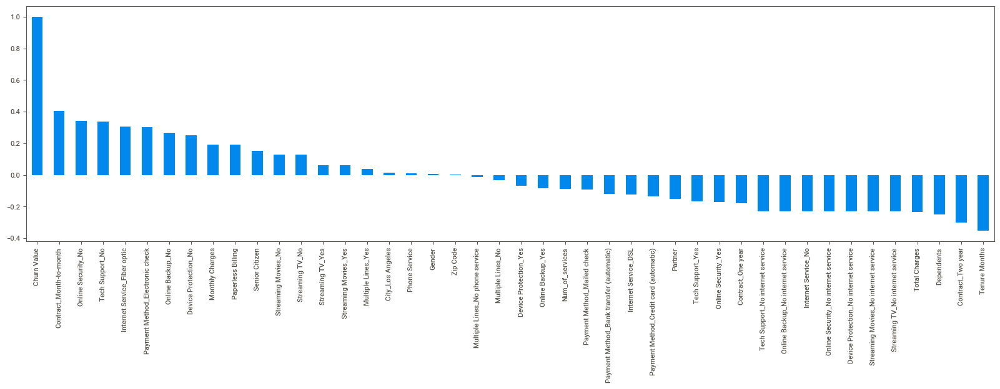

In [183]:
plt.figure(figsize=(16,10))
df.corr()['Churn Value'].sort_values(ascending = False).plot(kind = 'bar', figsize=(20,5))

# 3. Validate one or more preliminary classifiers and justify the best one
***After the best model is developed, test it on the 20% holdout set for final performance.***

Step 4: Model Development

In [36]:
import h2o
from h2o.automl import H2OAutoML

In [37]:
# h2o.shutdown(prompt = True)

In [38]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_261"; Java(TM) SE Runtime Environment (build 1.8.0_261-b12); Java HotSpot(TM) 64-Bit Server VM (build 25.261-b12, mixed mode)
  Starting server from /home/spatil@msctree.com/.local/lib/python3.6/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpm0mawr4w
  JVM stdout: /tmp/tmpm0mawr4w/h2o_spatil_msctree_com_started_from_python.out
  JVM stderr: /tmp/tmpm0mawr4w/h2o_spatil_msctree_com_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,01 secs
H2O_cluster_timezone:,America/New_York
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.5
H2O_cluster_version_age:,"14 days, 22 hours and 24 minutes"
H2O_cluster_name:,H2O_from_python_spatil_msctree_com_r2b2qa
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,13.92 Gb
H2O_cluster_total_cores:,24
H2O_cluster_allowed_cores:,24
H2O_cluster_status:,"accepting new members, healthy"


In [39]:
# Identify predictors and response

x = X_train.columns.tolist()
y = 'Churn Value'
x.remove(y)

In [40]:
# For binary classification, response should be a category
X_train[y] = X_train[y].astype('category')
X_test[y] = X_test[y].astype('category')

/opt/python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [41]:
X_train

,Zip Code,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Num_of_services,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check,City_Los Angeles
CustomerID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5127-BZENZ,0.982955,1,0,1,0,0.777778,1,0,0.467164,0.769964,0,0.333333,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0
5982-XMDEX,0.519805,1,0,0,0,0.902778,1,0,0.082090,0.620472,0,0.000000,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0
8212-DJRCH,0.214123,0,0,1,1,0.069444,1,1,0.717413,0.405383,0,0.500000,1,0,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0
4632-PAOYU,0.455682,0,0,1,1,0.305556,1,0,0.016915,0.405080,0,0.000000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
9066-QRSDU,0.638312,1,0,1,0,0.958333,1,1,0.080100,0.627533,0,0.000000,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2796-UUZZO,0.974188,0,0,1,1,0.875000,1,1,0.617413,0.848231,0,0.333333,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0
3721-CNZHX,0.763474,0,0,0,0,0.208333,1,0,0.015423,0.360723,0,0.000000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
7492-TAFJD,0.130195,0,0,1,0,0.097222,0,0,0.201990,0.350725,0,0.500000,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0


In [42]:
test=h2o.H2OFrame(X_test)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [43]:
test

Zip Code,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Num_of_services,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check,City_Los Angeles
0.524838,0,0,0,0,1,0,1,0.452239,0.825822,0,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,0,0
0.741071,1,1,1,0,0.458333,1,1,0.620398,0.709174,1,0.166667,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0
0.911364,1,0,0,0,0.0833333,1,1,0.553234,0.395029,0,0,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0
0.406169,1,0,1,0,0.0277778,1,1,0.558706,0.275834,1,0.166667,1,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0
0.862013,0,0,0,0,0.791667,0,1,0.353234,0.748937,0,0.666667,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0
0.912825,1,0,1,0,0.416667,1,0,0.0139303,0.462563,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0
0.746916,1,0,0,0,0.0138889,1,0,0.60995,0.224791,1,0.166667,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0
0.287175,0,1,1,0,0.222222,1,1,0.800995,0.607934,1,0.5,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0
0.163799,1,0,1,0,0.152778,1,0,0.0233831,0.330085,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
0.744481,1,0,1,0,0.680556,1,0,0.00746269,0.514114,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0


In [44]:
# Split the data into Train/Validation with Train having 80% and 20% each
train,valid = h2o.H2OFrame(X_train).split_frame(ratios= [0.8],seed = 155)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [45]:
# Run AutoML for 20 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=10, seed=155)
aml.train(x=x, y=y, training_frame=train, validation_frame = valid, leaderboard_frame=test)

AutoML progress: |
17:44:02.853: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

████████████████████████████████████████████████████████| 100%


In [46]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=lb.nrows)  # Print all rows instead of default (10 rows)

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
StackedEnsemble_AllModels_AutoML_20210819_174402,0.12602,0.354993,0.12602,0.260122,0.248748
StackedEnsemble_BestOfFamily_AutoML_20210819_174402,0.126332,0.355432,0.126332,0.26124,0.249064
GBM_5_AutoML_20210819_174402,0.127575,0.357176,0.127575,0.257422,0.250157
GBM_2_AutoML_20210819_174402,0.128598,0.358605,0.128598,0.25475,0.2512
GBM_1_AutoML_20210819_174402,0.129177,0.359412,0.129177,0.256943,0.251886
GLM_1_AutoML_20210819_174402,0.13056,0.361332,0.13056,0.288066,0.256646
XGBoost_3_AutoML_20210819_174402,0.130983,0.361916,0.130983,0.259274,0.254324
GBM_3_AutoML_20210819_174402,0.132815,0.364439,0.132815,0.256068,0.255633
GBM_4_AutoML_20210819_174402,0.13531,0.367845,0.13531,0.257203,0.257518
DRF_1_AutoML_20210819_174402,0.139713,0.373782,0.139713,0.261778,0.262876


In [48]:
###################################################
#  Use one or more cells for your implementation  #
###################################################

# 4. Visualize/tabulate your results

In [49]:
###################################################
#  Use one or more cells for your implementation  #
###################################################

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_AutoML_20210819_174402,0.12602,0.354993,0.12602,0.260122,0.248748,626,0.012981,StackedEnsemble
StackedEnsemble_BestOfFamily_AutoML_20210819_174402,0.126332,0.355432,0.126332,0.26124,0.249064,627,0.016363,StackedEnsemble
GBM_5_AutoML_20210819_174402,0.127575,0.357176,0.127575,0.257422,0.250157,260,0.011775,GBM
GBM_2_AutoML_20210819_174402,0.128598,0.358605,0.128598,0.25475,0.2512,262,0.008484,GBM
GBM_1_AutoML_20210819_174402,0.129177,0.359412,0.129177,0.256943,0.251886,470,0.009378,GBM
GLM_1_AutoML_20210819_174402,0.13056,0.361332,0.13056,0.288066,0.256646,283,0.001296,GLM
XGBoost_3_AutoML_20210819_174402,0.130983,0.361916,0.130983,0.259274,0.254324,254,0.002291,XGBoost
GBM_3_AutoML_20210819_174402,0.132815,0.364439,0.132815,0.256068,0.255633,309,0.00922,GBM
GBM_4_AutoML_20210819_174402,0.13531,0.367845,0.13531,0.257203,0.257518,349,0.009774,GBM
DRF_1_AutoML_20210819_174402,0.139713,0.373782,0.139713,0.261778,0.262876,1028,0.013898,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

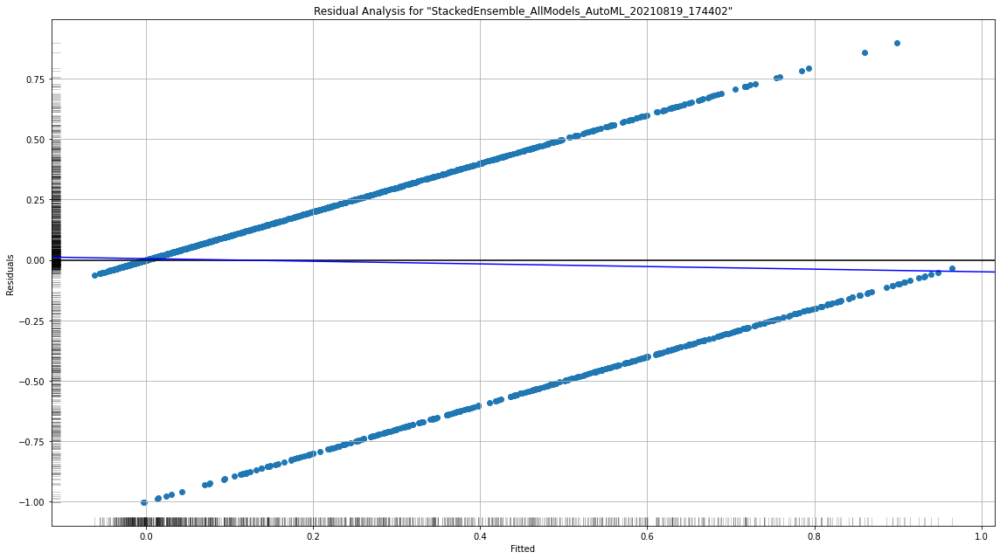

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

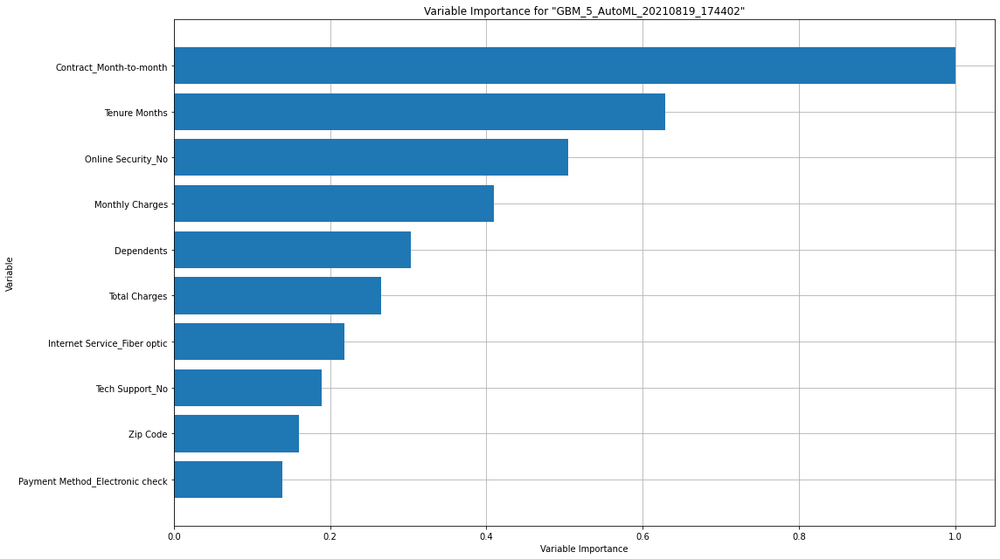

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

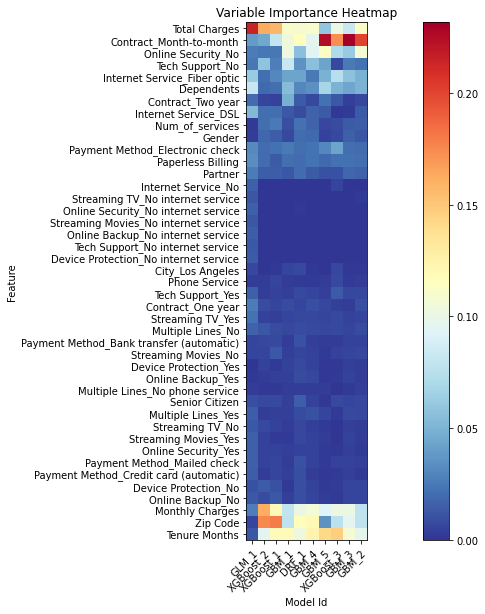

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

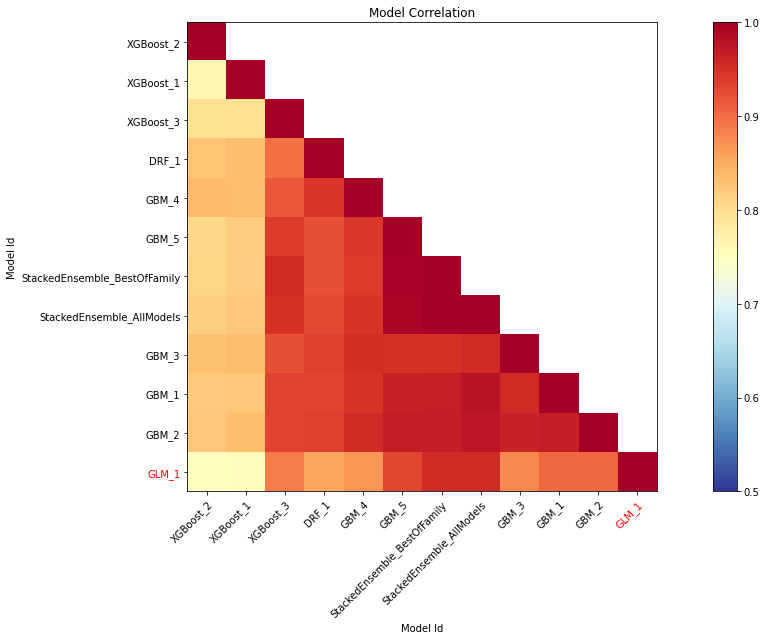

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

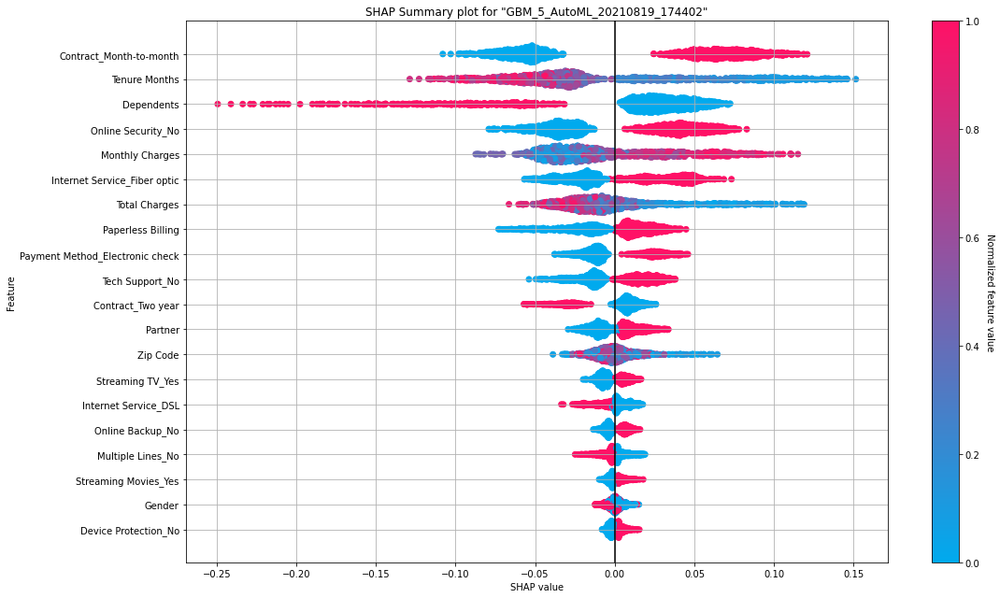

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

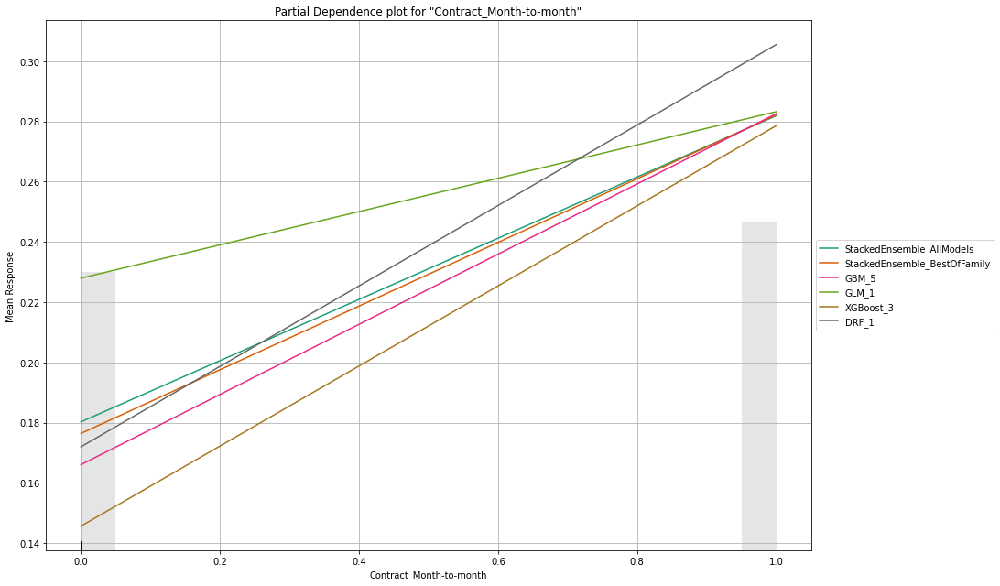

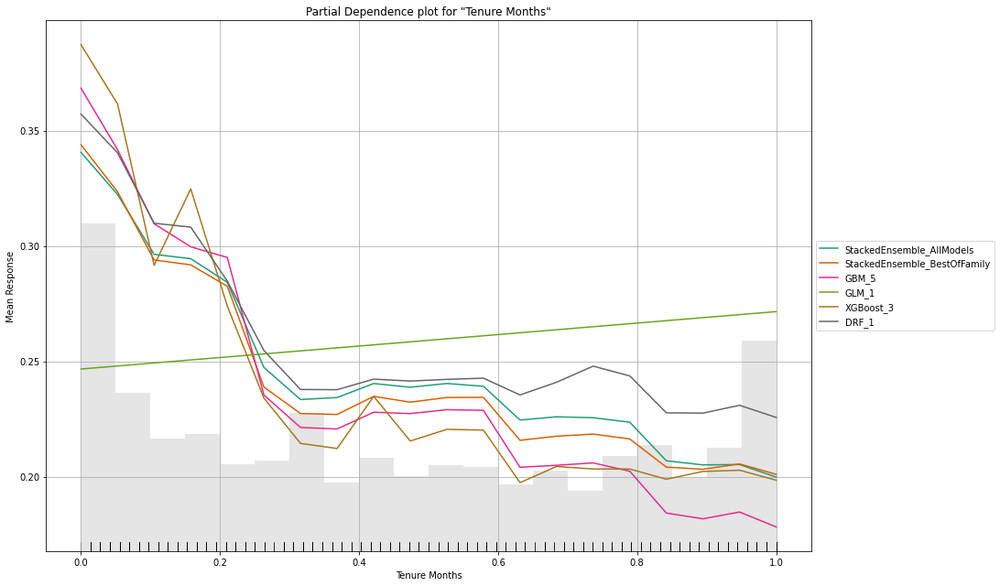

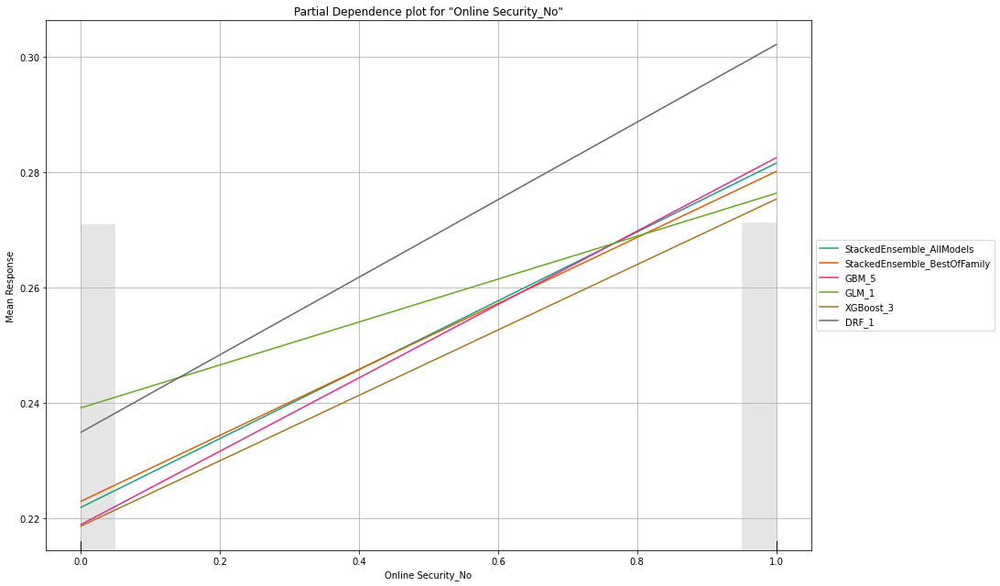

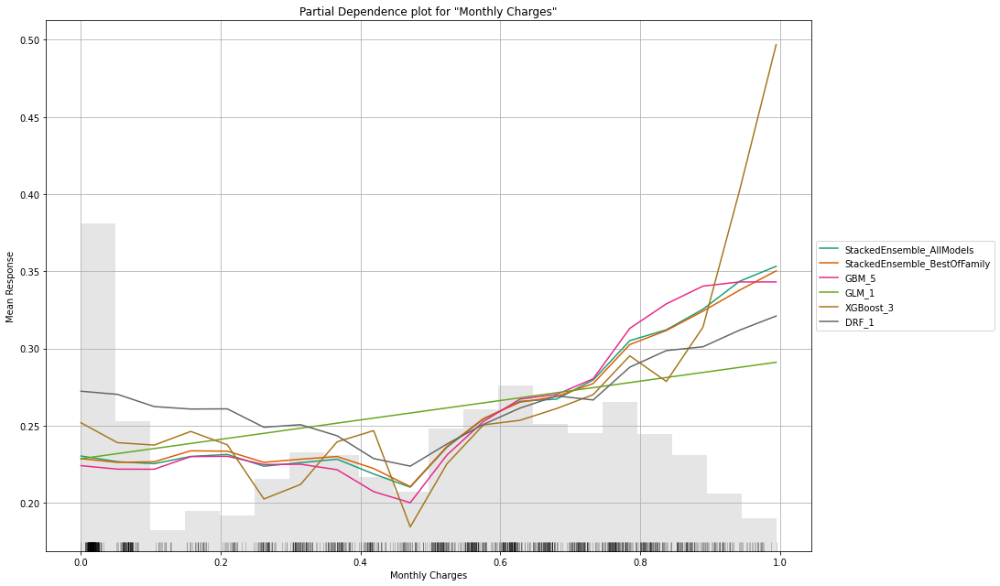

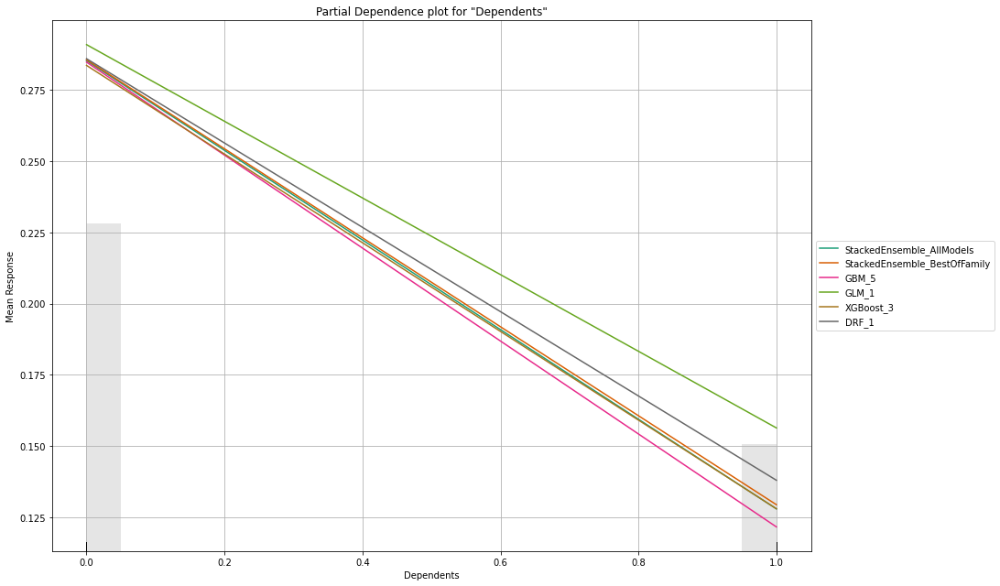

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

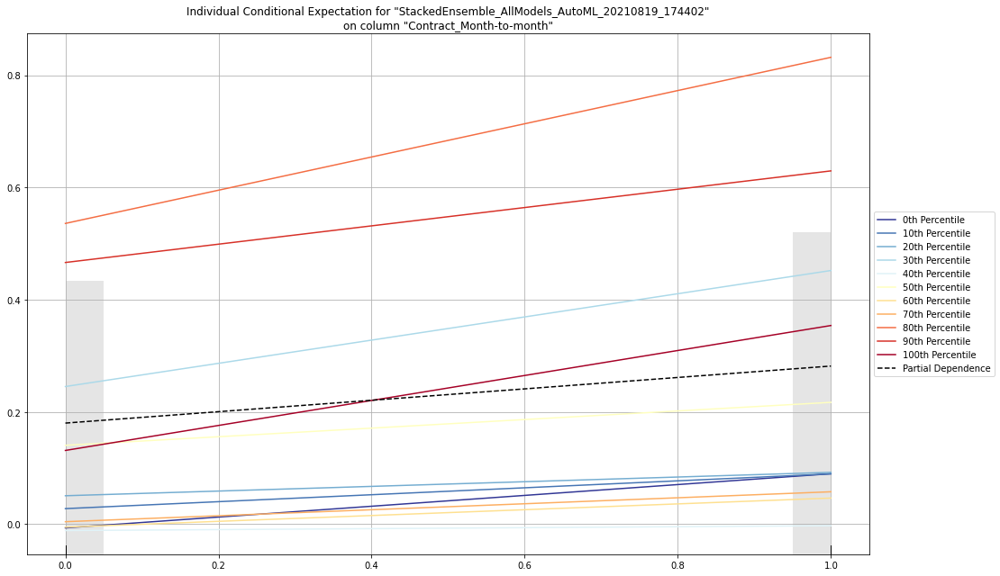

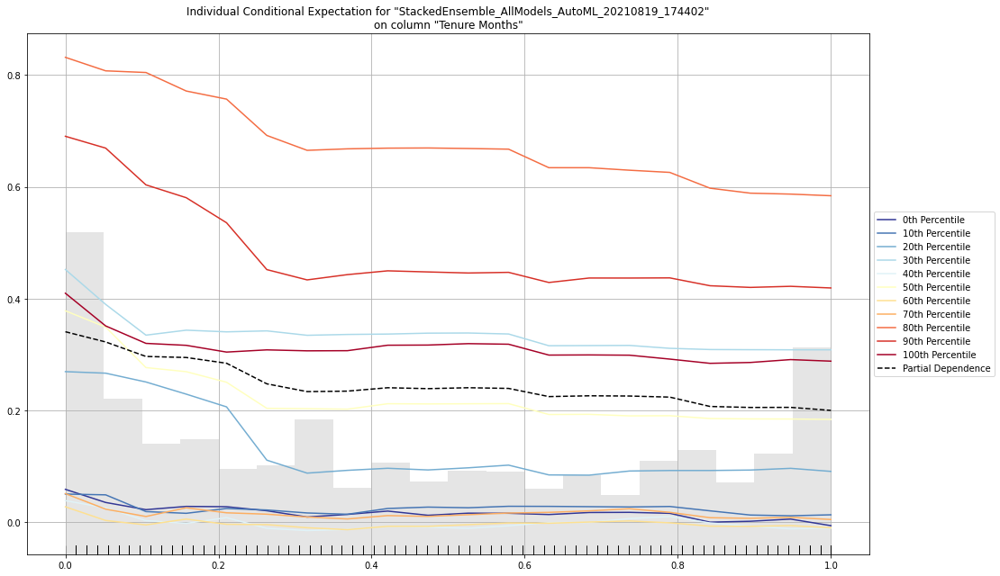

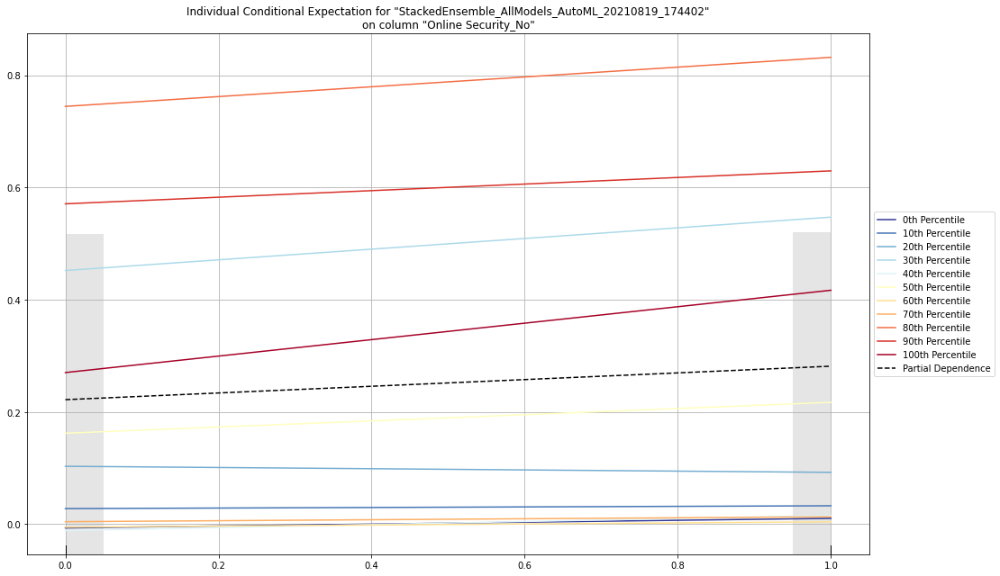

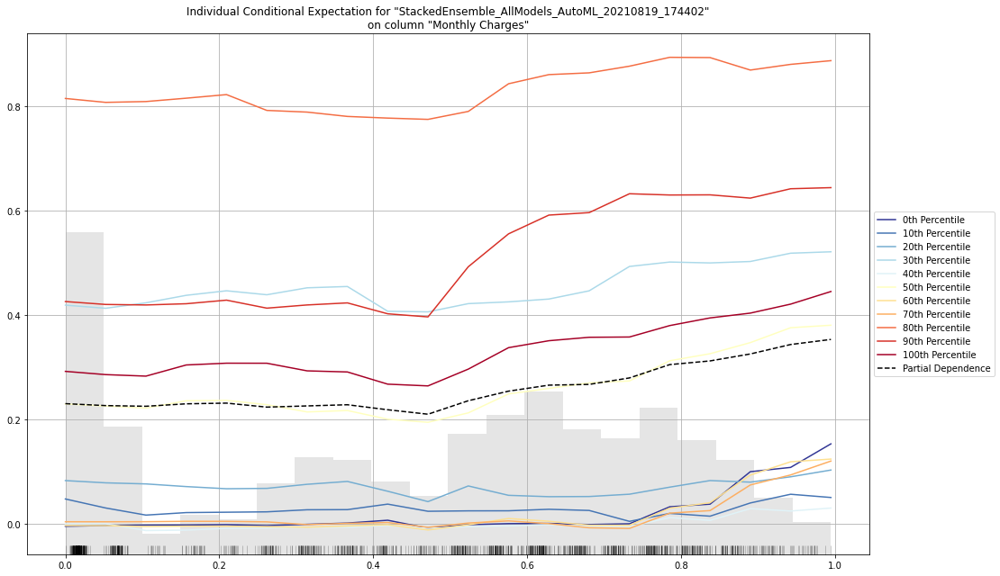

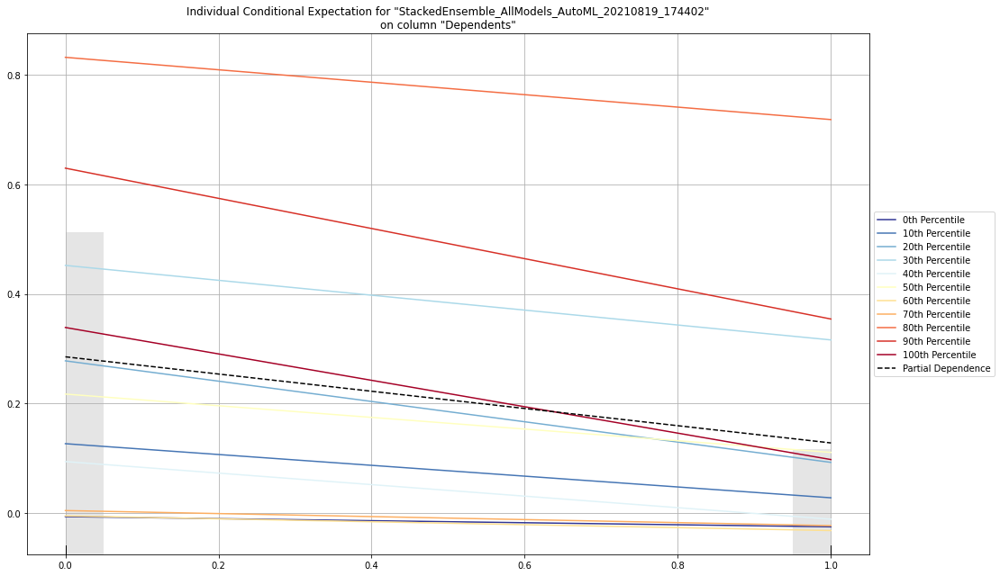

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,mean_residual_deviance,rmse,mse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_AutoML_20210819_174402,0.12602,0.354993,0.12602,0.260122,0.248748,626,0.012981,StackedEnsemble
StackedEnsemble_BestOfFamily_AutoML_20210819_174402,0.126332,0.355432,0.126332,0.26124,0.249064,627,0.016363,StackedEnsemble
GBM_5_AutoML_20210819_174402,0.127575,0.357176,0.127575,0.257422,0.250157,260,0.011775,GBM
GBM_2_AutoML_20210819_174402,0.128598,0.358605,0.128598,0.25475,0.2512,262,0.008484,GBM
GBM_1_AutoML_20210819_174402,0.129177,0.359412,0.129177,0.256943,0.251886,470,0.009378,GBM
GLM_1_AutoML_20210819_174402,0.13056,0.361332,0.13056,0.288066,0.256646,283,0.001296,GLM
XGBoost_3_AutoML_20210819_174402,0.130983,0.361916,0.130983,0.259274,0.254324,254,0.002291,XGBoost
GBM_3_AutoML_20210819_174402,0.132815,0.364439,0.132815,0.256068,0.255633,309,0.00922,GBM
GBM_4_AutoML_20210819_174402,0.13531,0.367845,0.13531,0.257203,0.257518,349,0.009774,GBM
DRF_1_AutoML_20210819_174402,0.139713,0.373782,0.139713,0.261778,0.262876,1028,0.013898,DRF


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

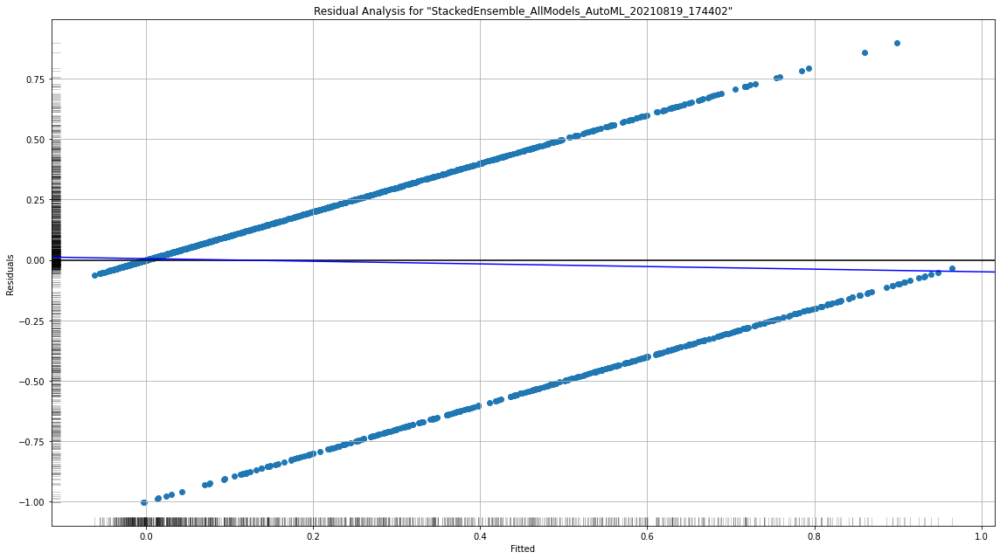

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

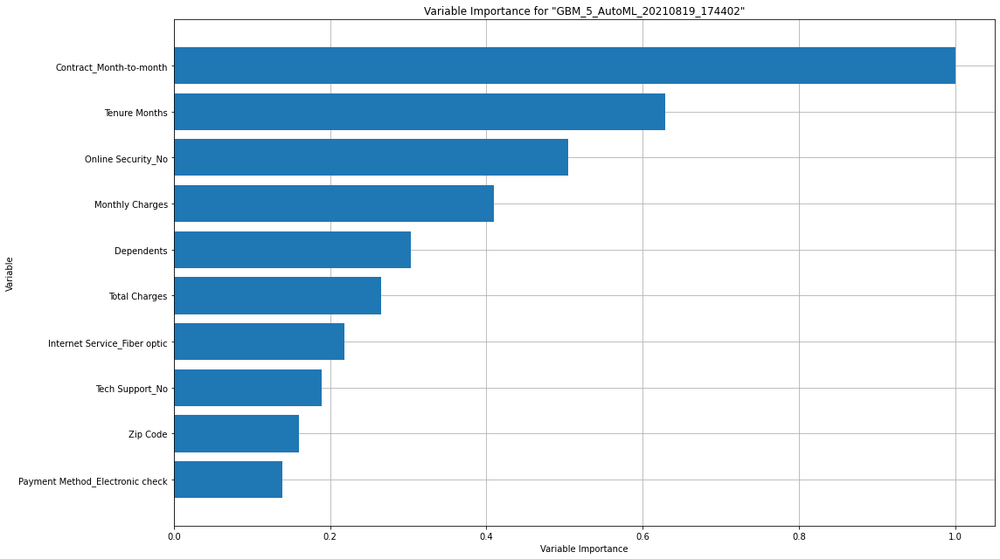

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

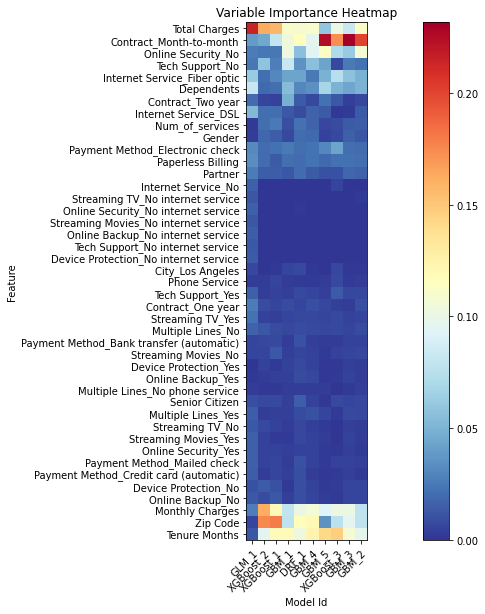

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

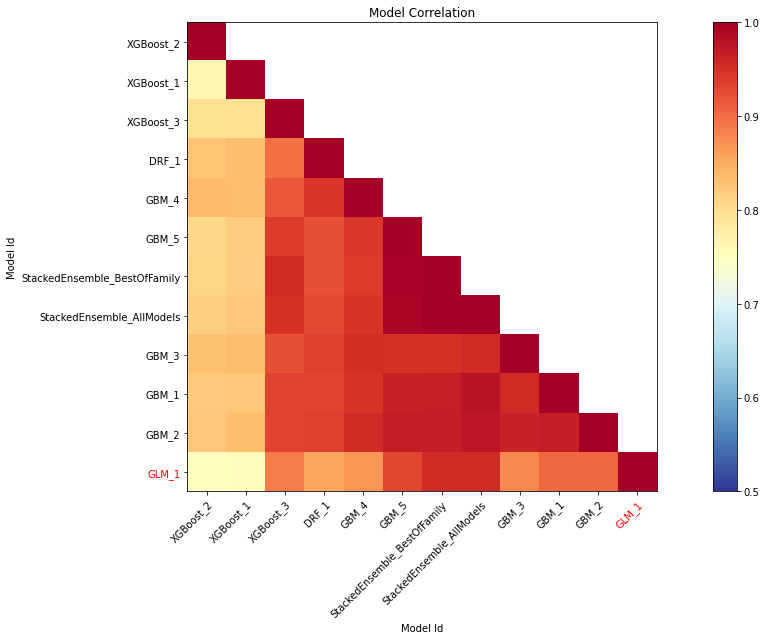

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

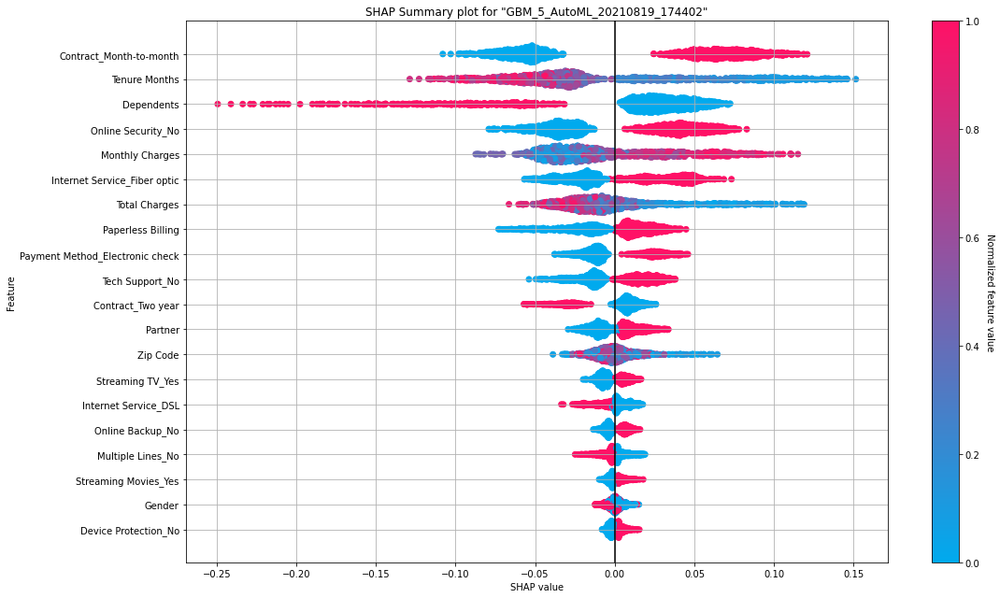

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

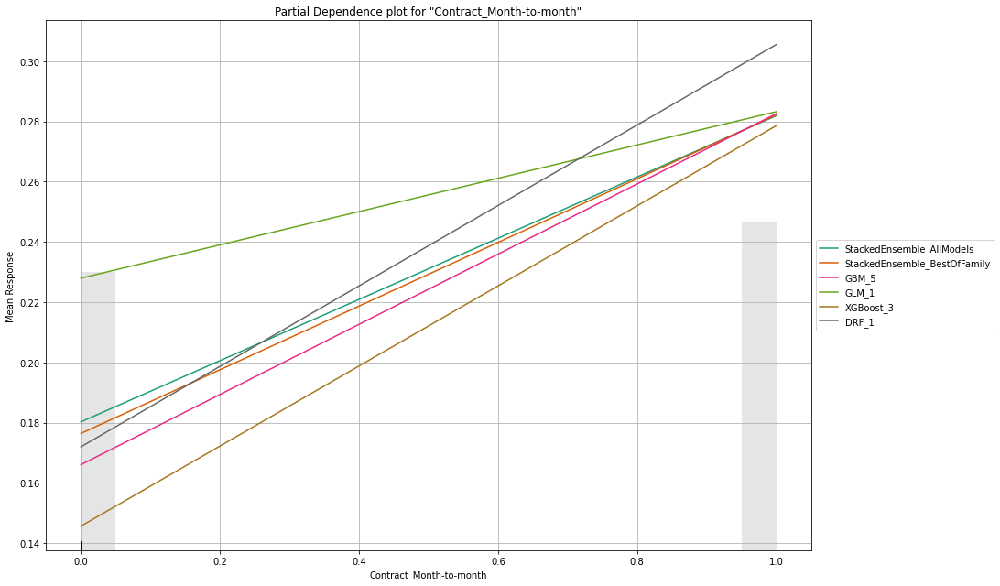

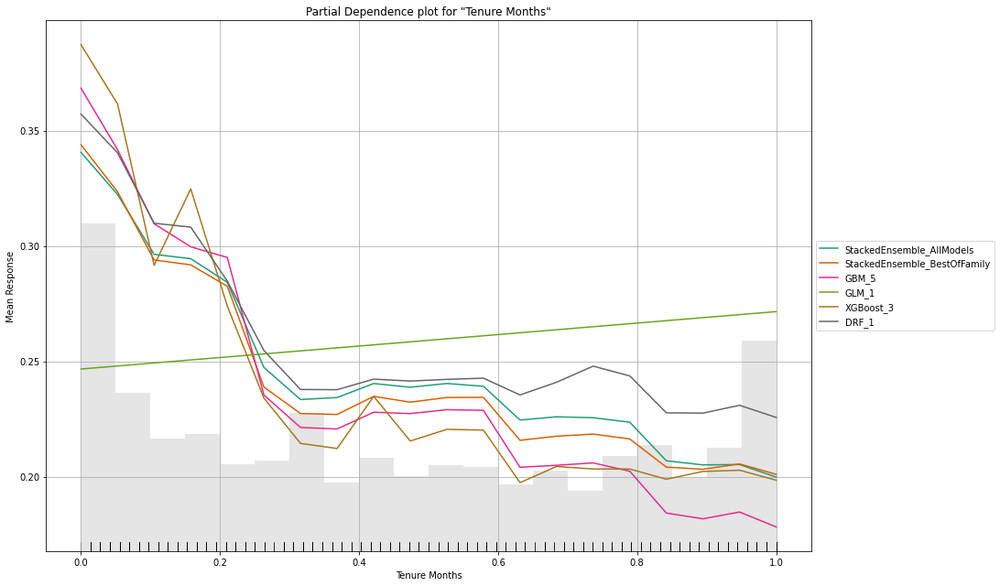

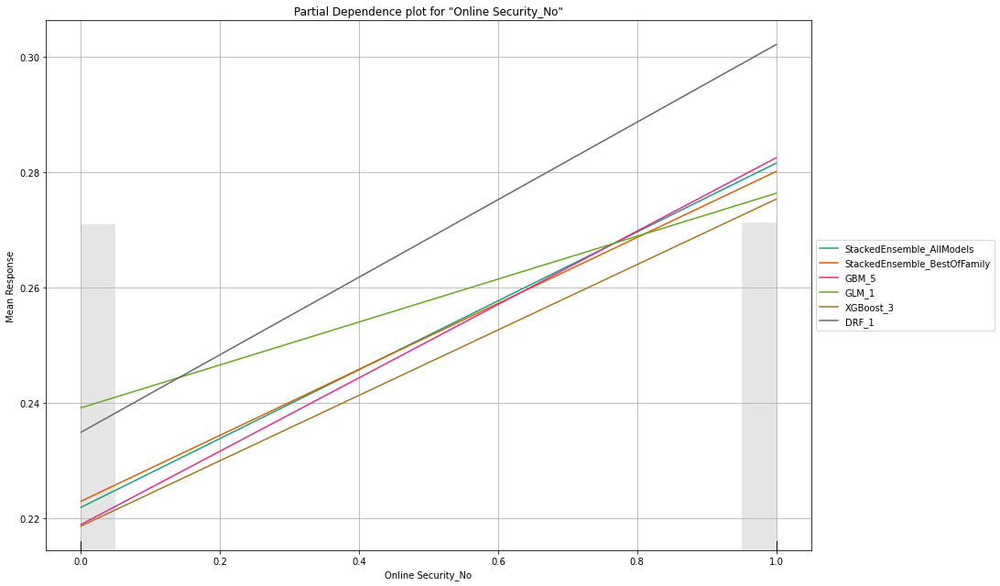

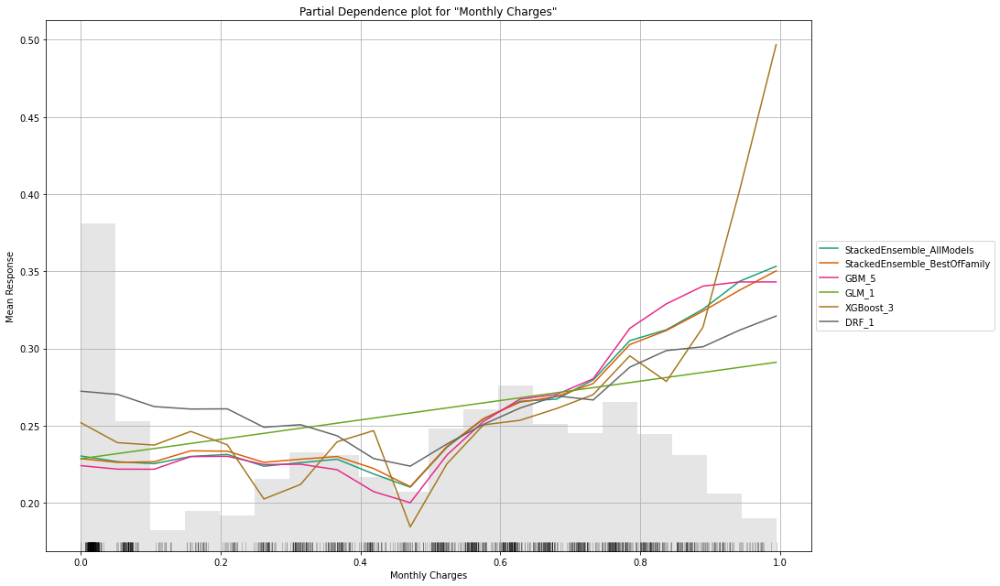

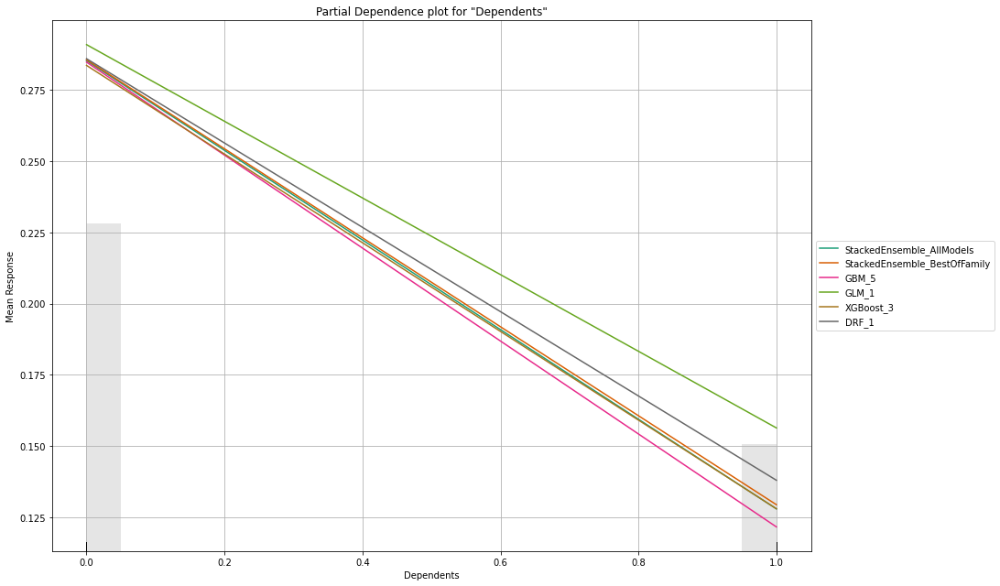

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

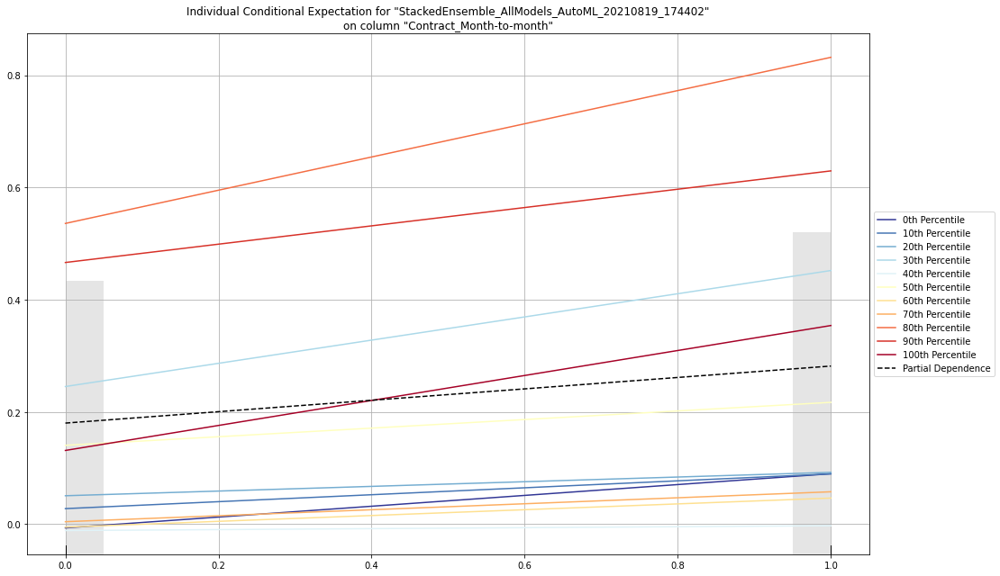

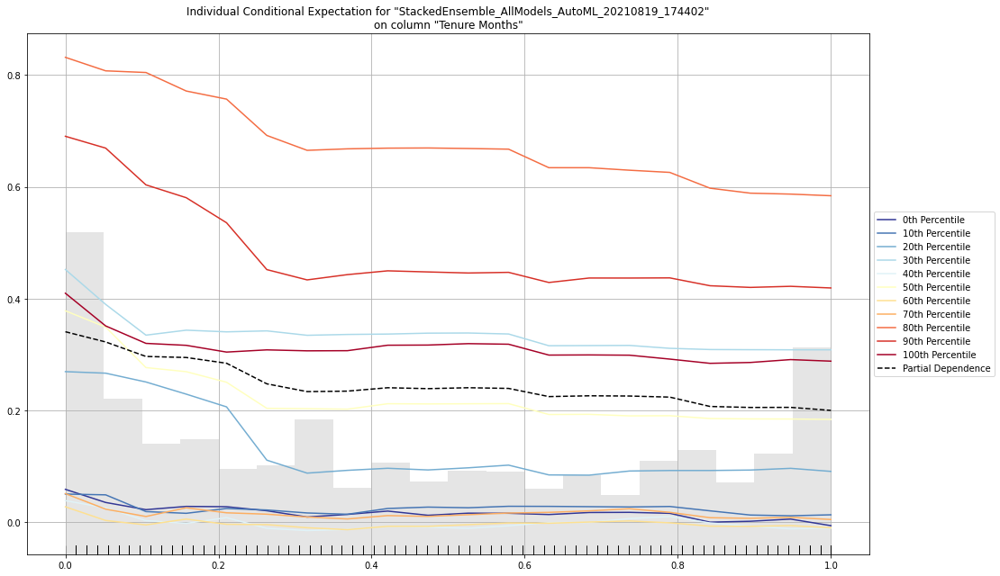

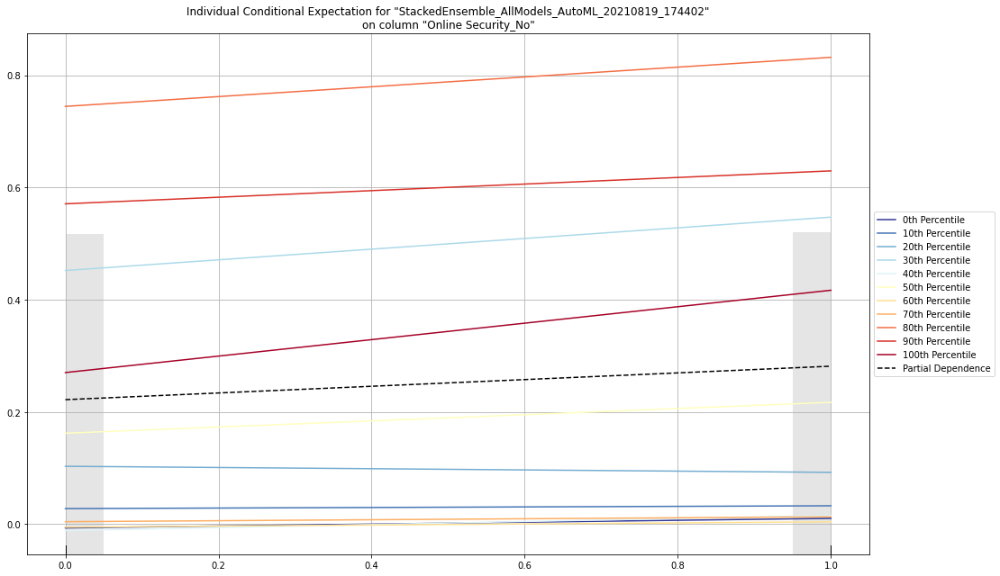

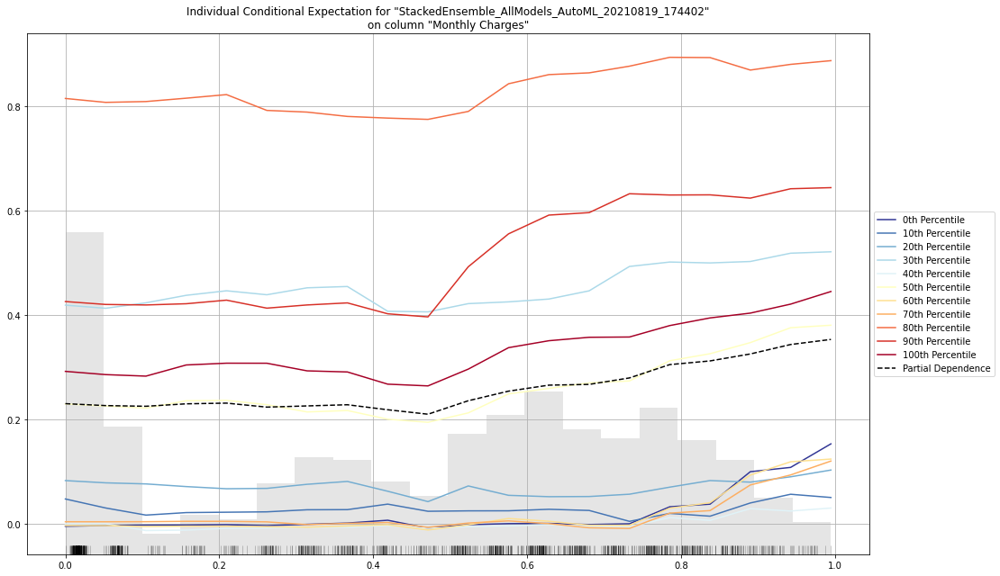

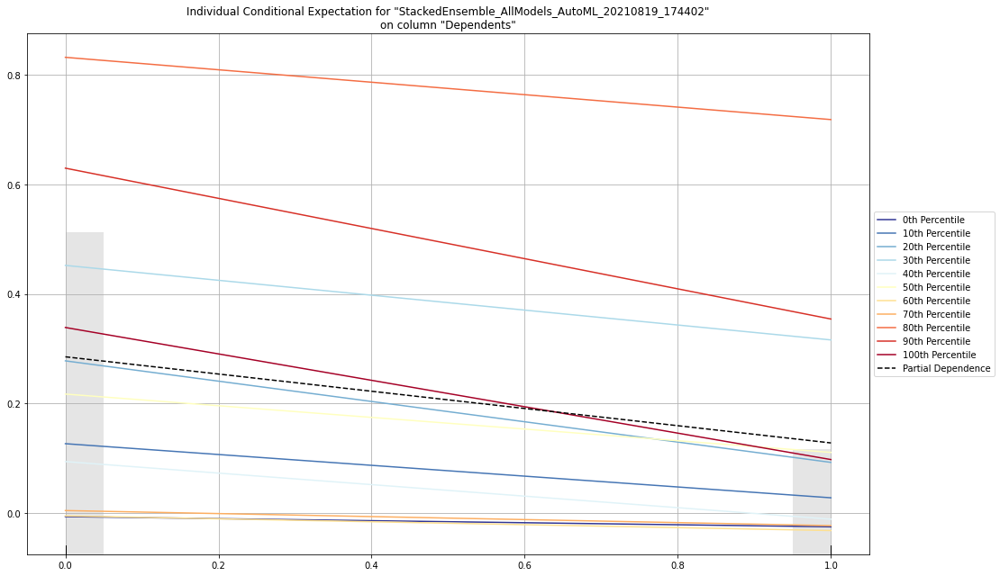

In [47]:
aml.explain(test)

In [48]:
aml.leader.r2()

0.4527890457199255

In [49]:
aml.leader

Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_AutoML_20210819_174402

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.10540300883144461
RMSE: 0.32465829549149766
MAE: 0.23857892360681918
RMSLE: 0.22773437259415943
R^2: 0.4527890457199255
Mean Residual Deviance: 0.10540300883144461
Null degrees of freedom: 4518
Residual degrees of freedom: 4511
Null deviance: 870.4434609427402
Residual deviance: 476.31619690929824
AIC: 2674.7787110455147

ModelMetricsRegressionGLM: stackedensemble
** Reported on validation data. **

MSE: 0.13739700398459406
RMSE: 0.3706710185388036
MAE: 0.2690089875826965
RMSLE: 0.2573515688610054
R^2: 0.3260284625571246
Mean Residual Deviance: 0.13739700398459406
Null degrees of freedom: 1114
Residual degrees of freedom: 1107
Null deviance: 227.98861275700264
Residual deviance: 153.19765944282238
AIC: 969.0909435369477

ModelMetricsRegressionGLM: stac

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

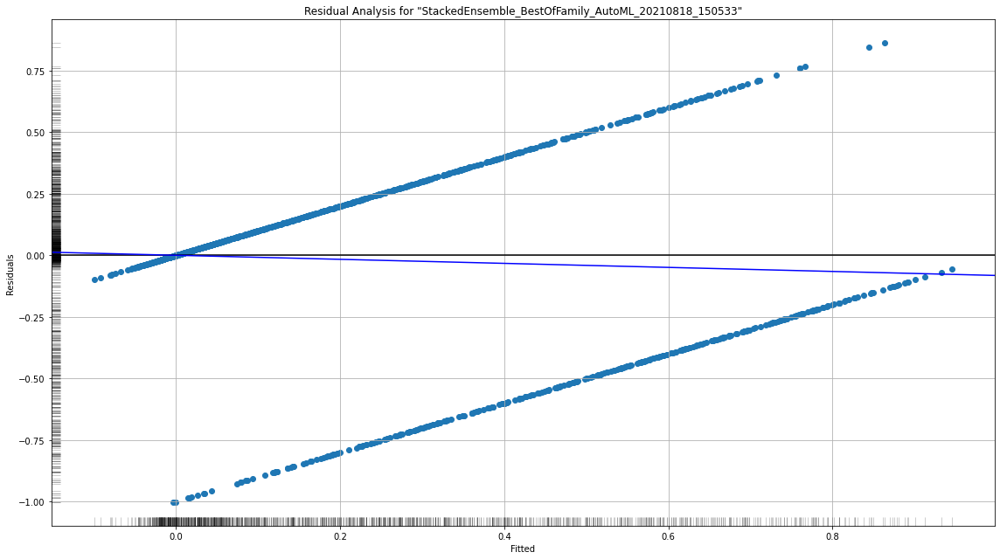

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

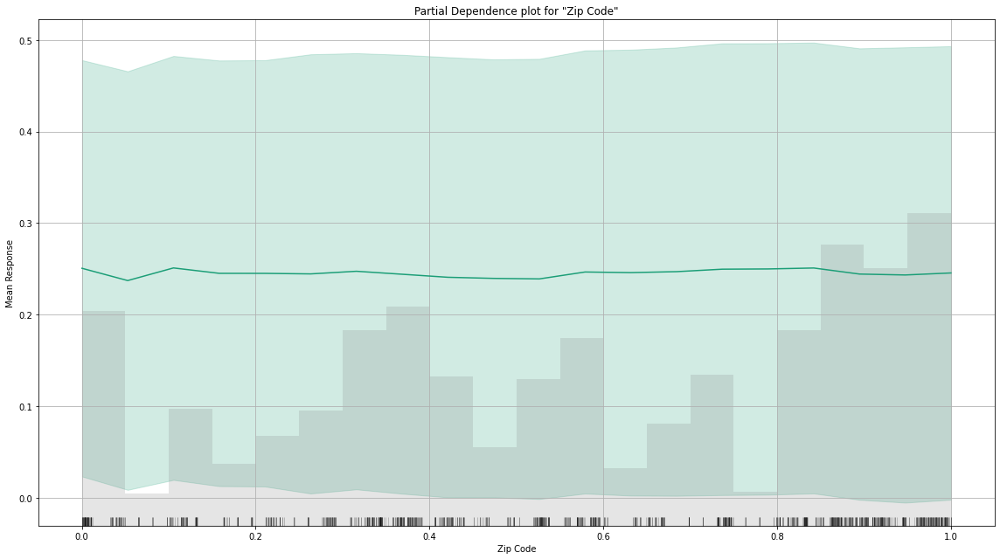

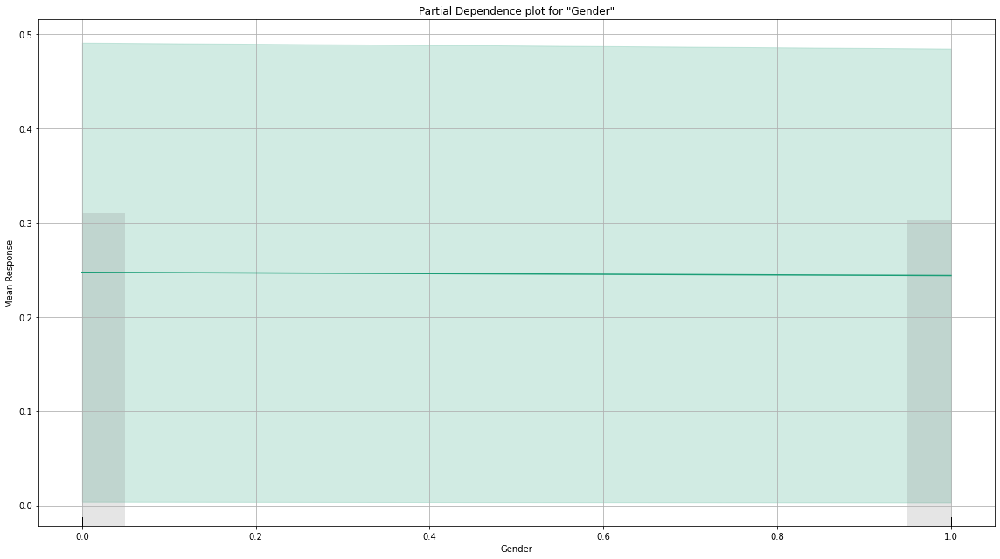

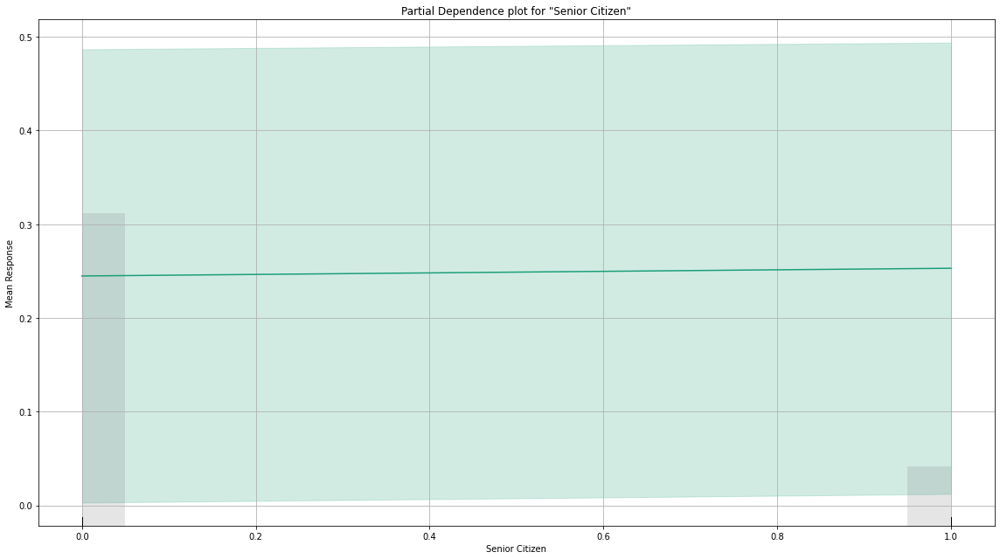

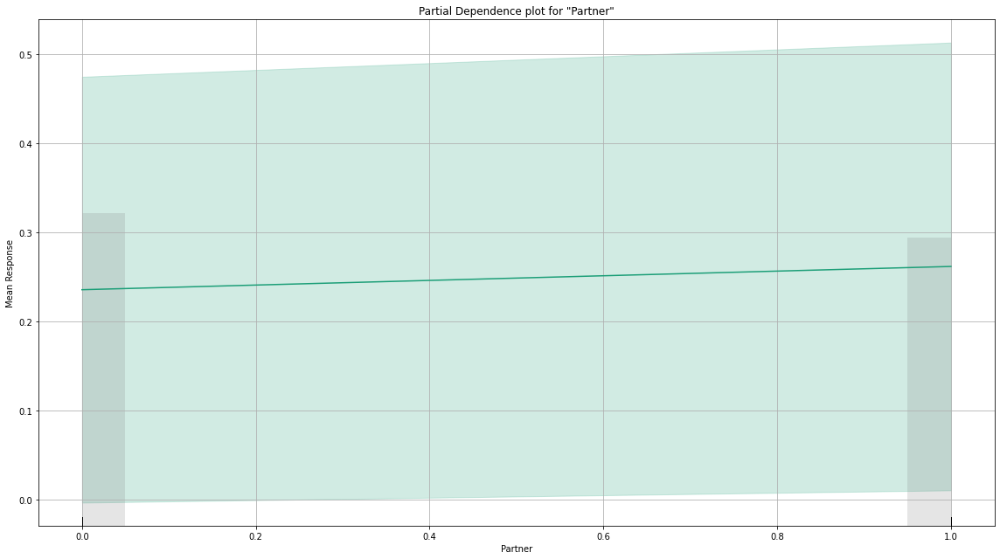

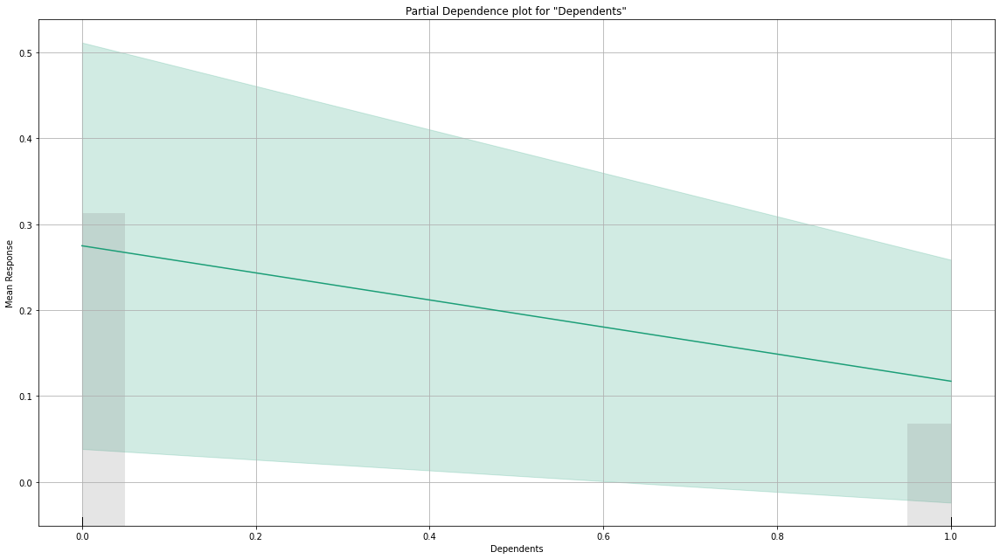

...

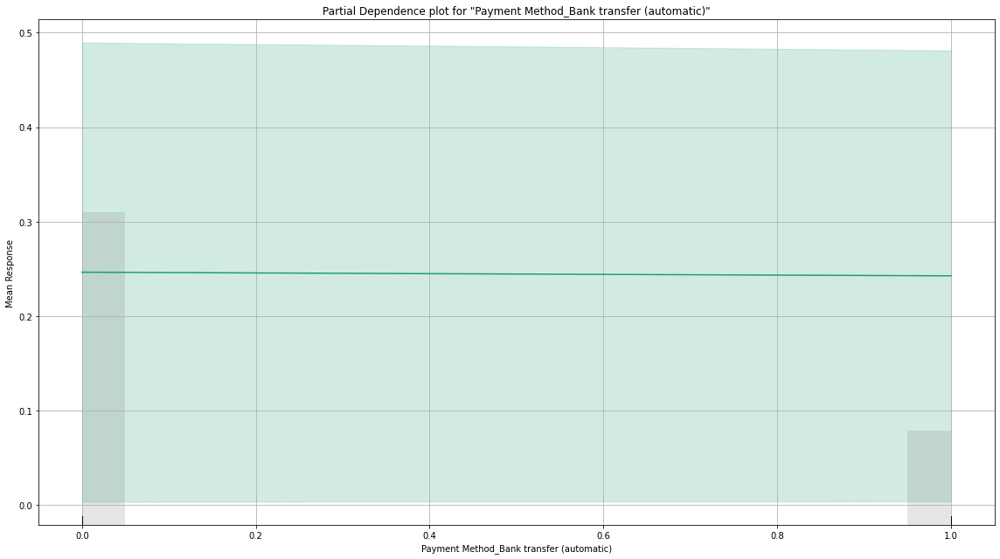

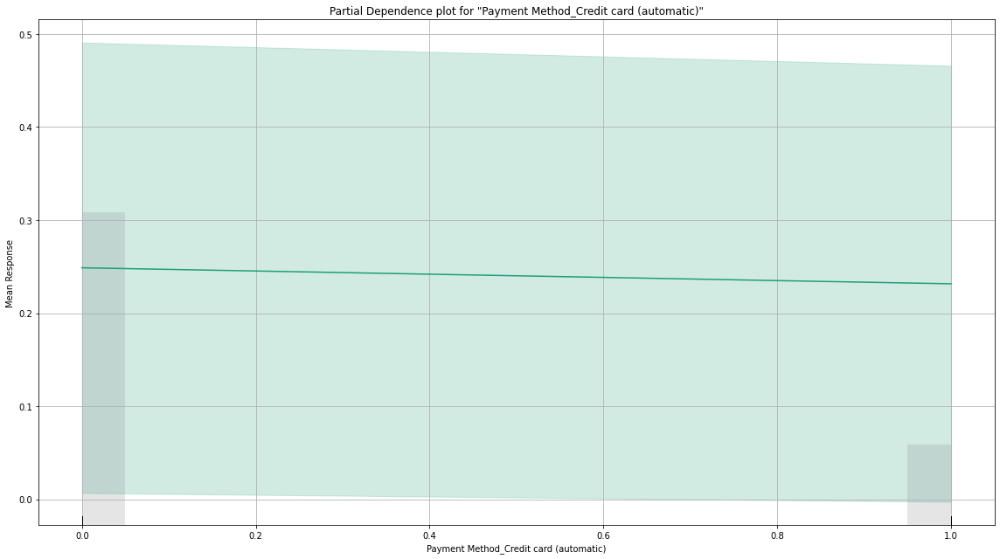

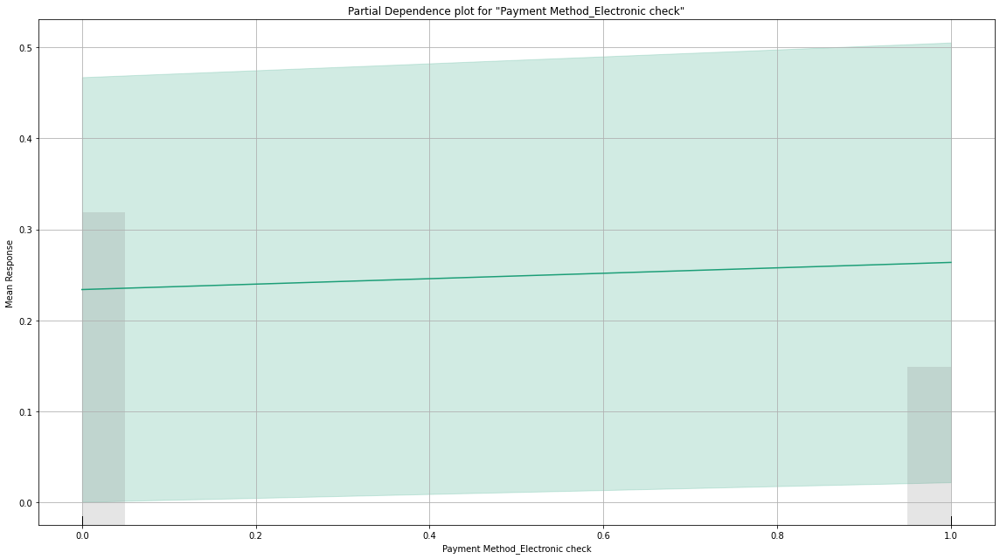

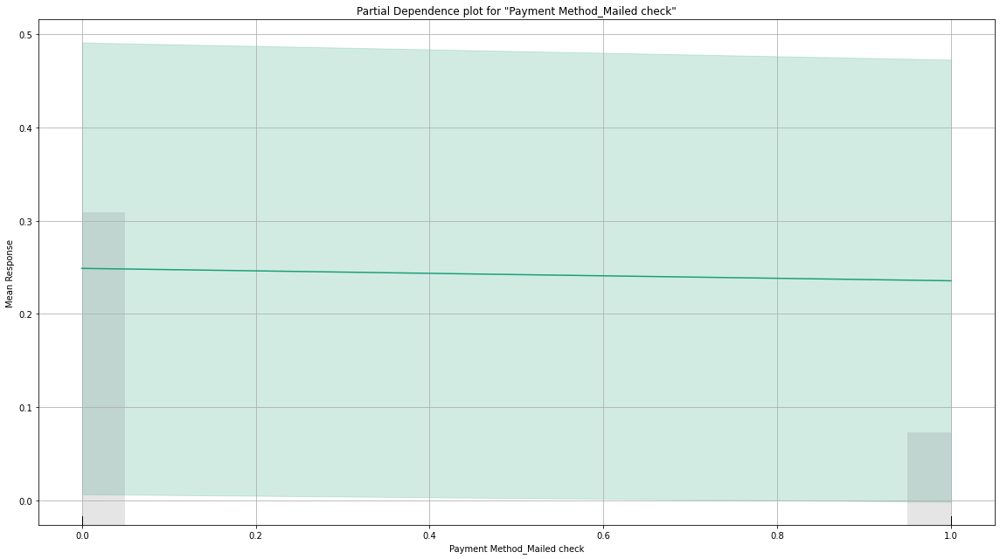

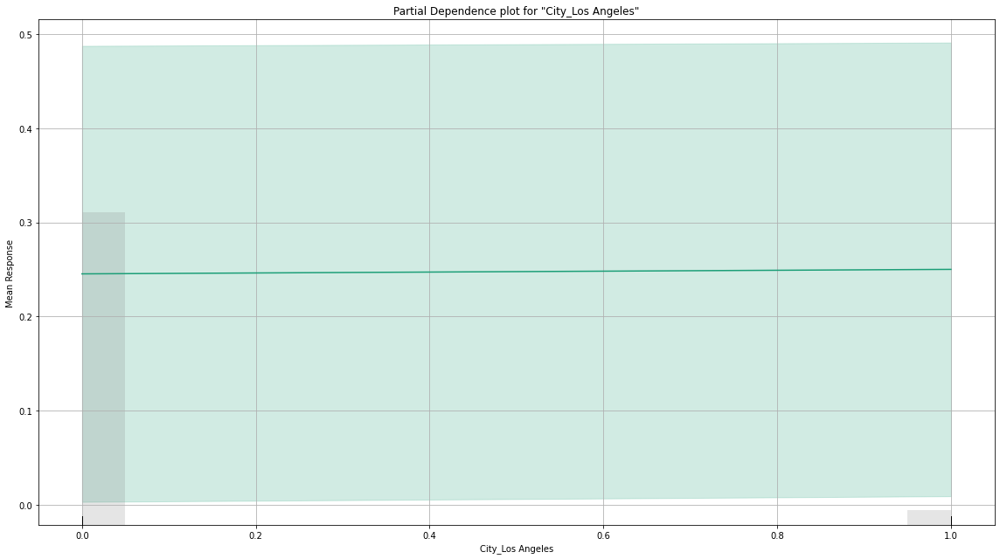

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

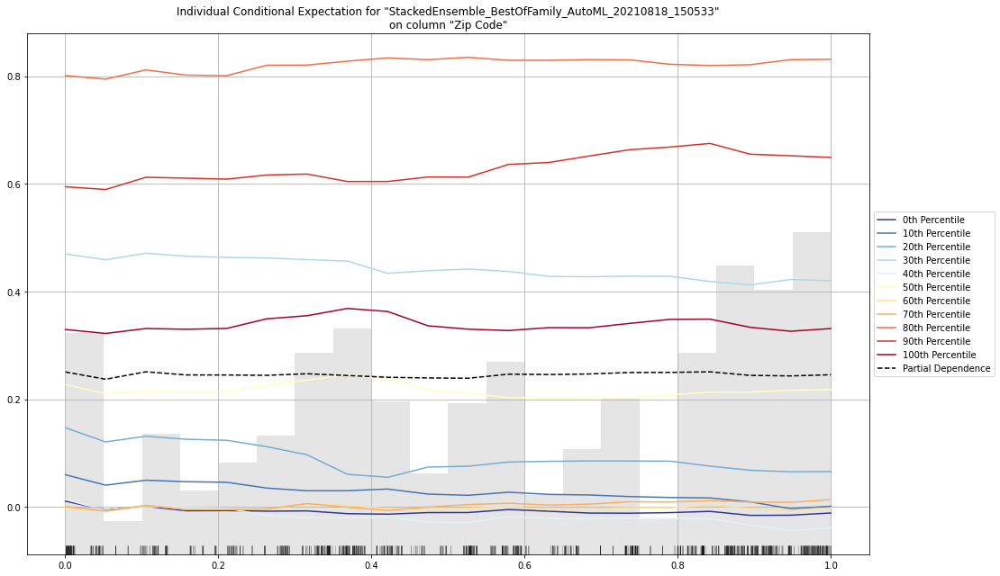

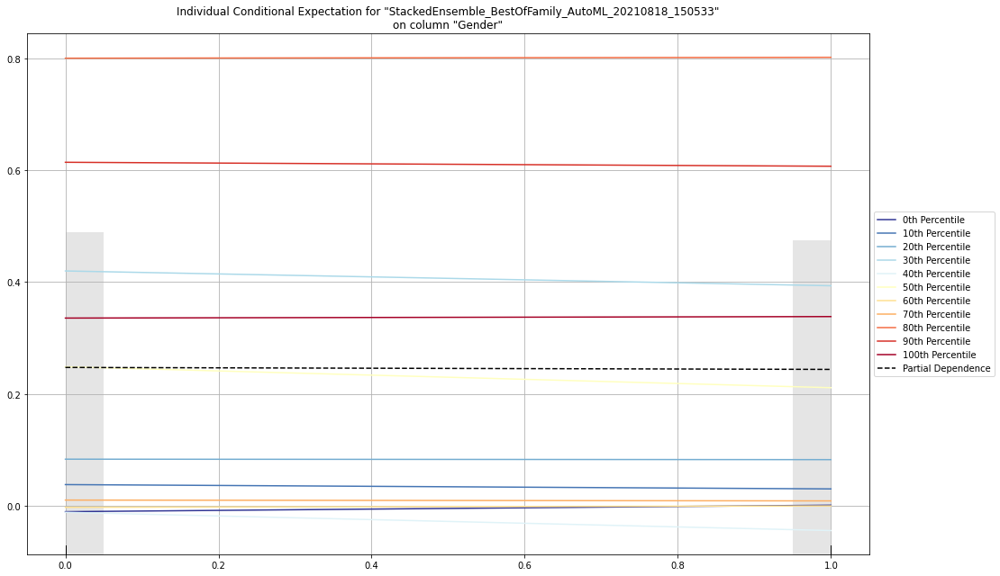

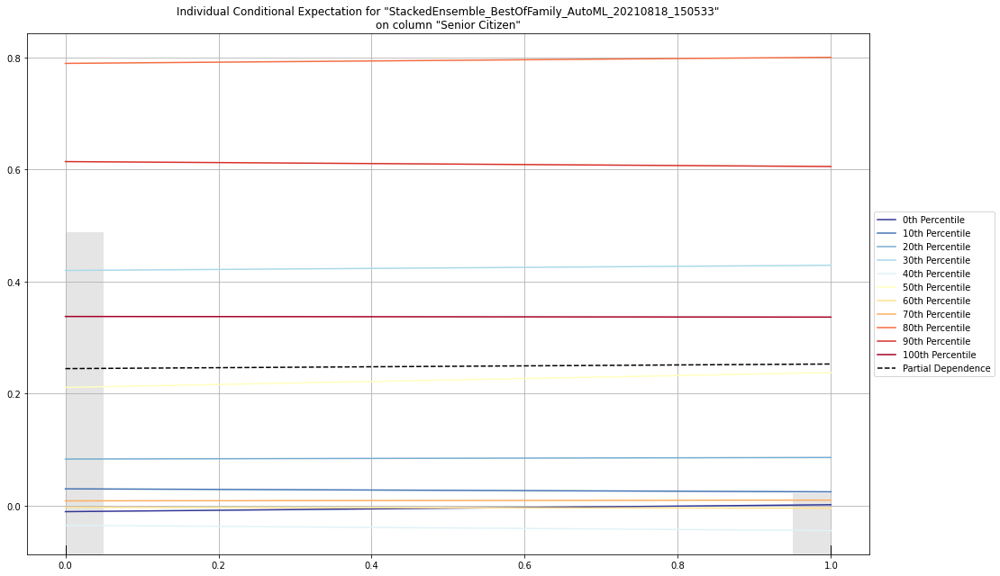

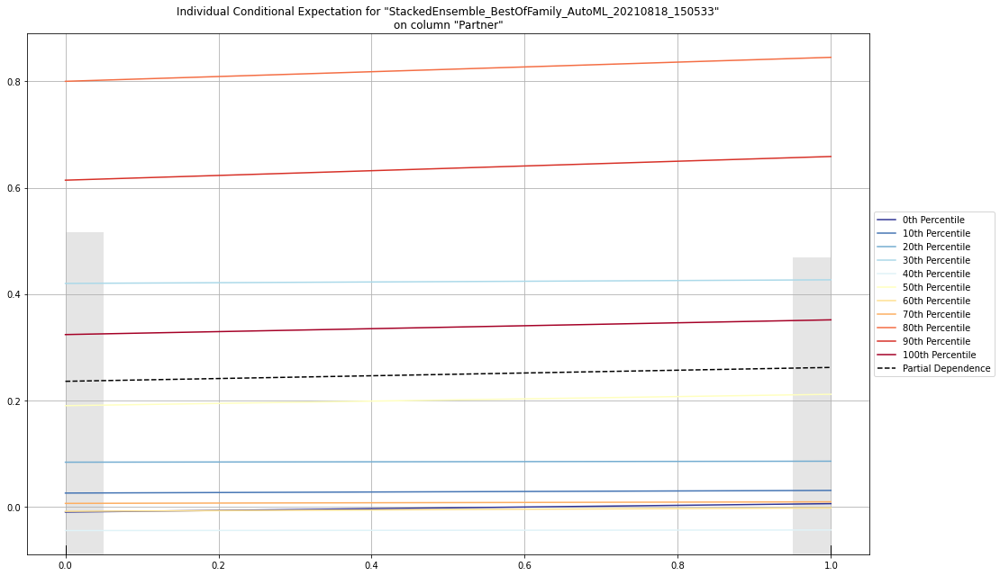

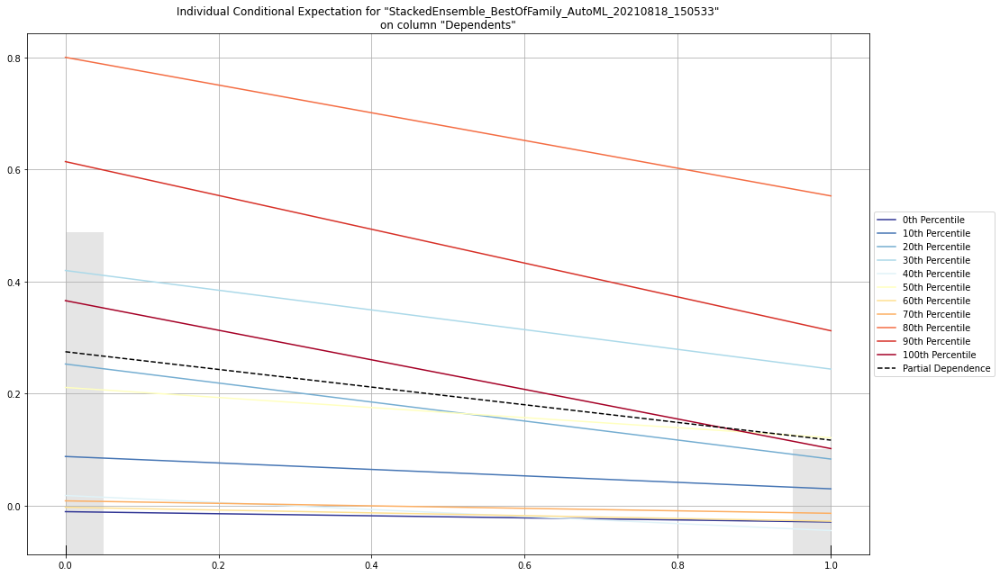

...

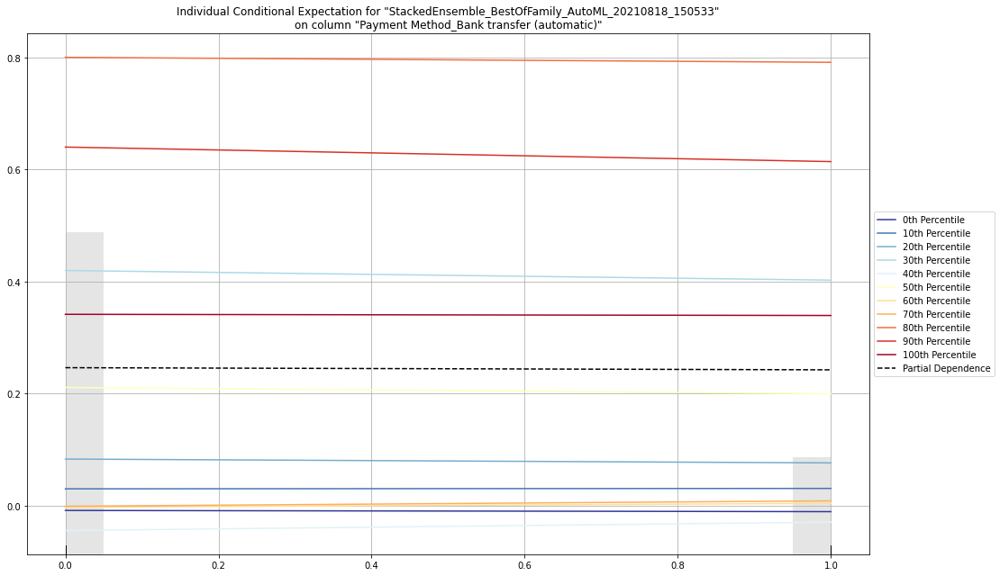

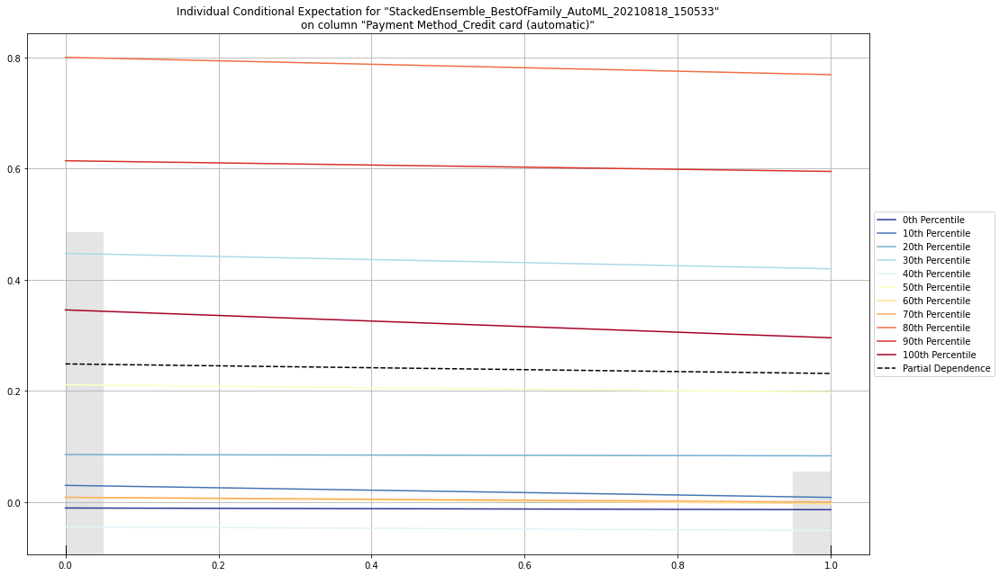

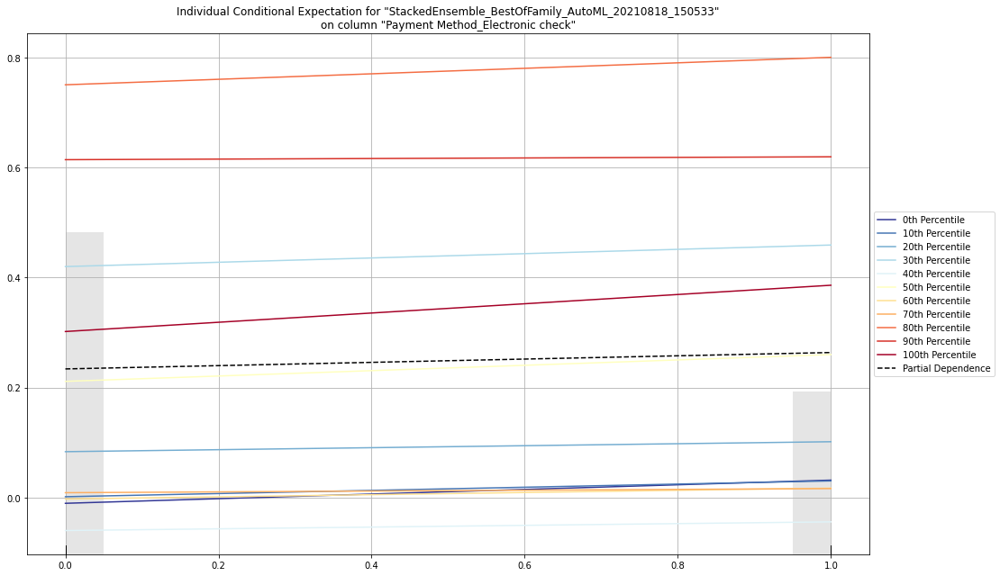

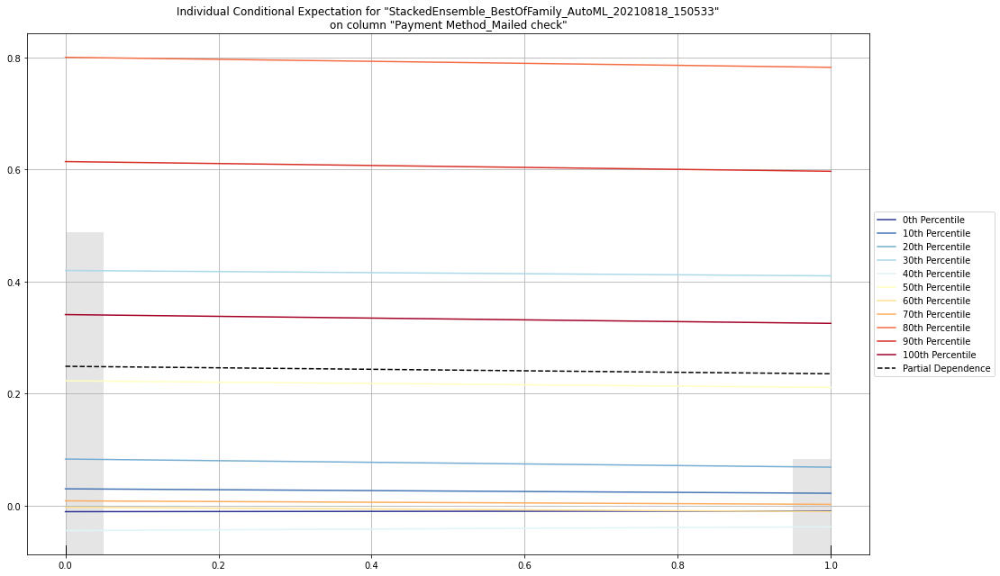

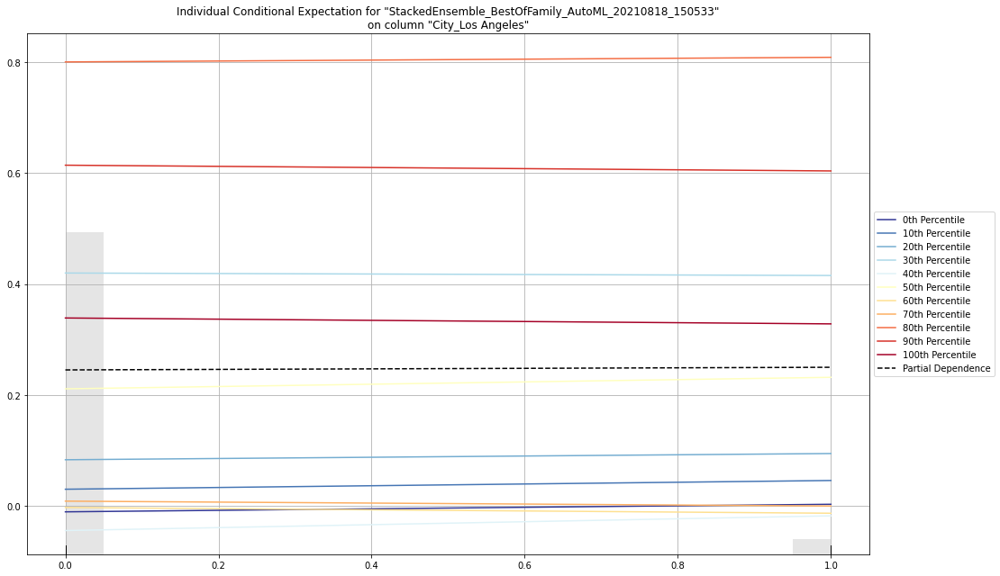

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

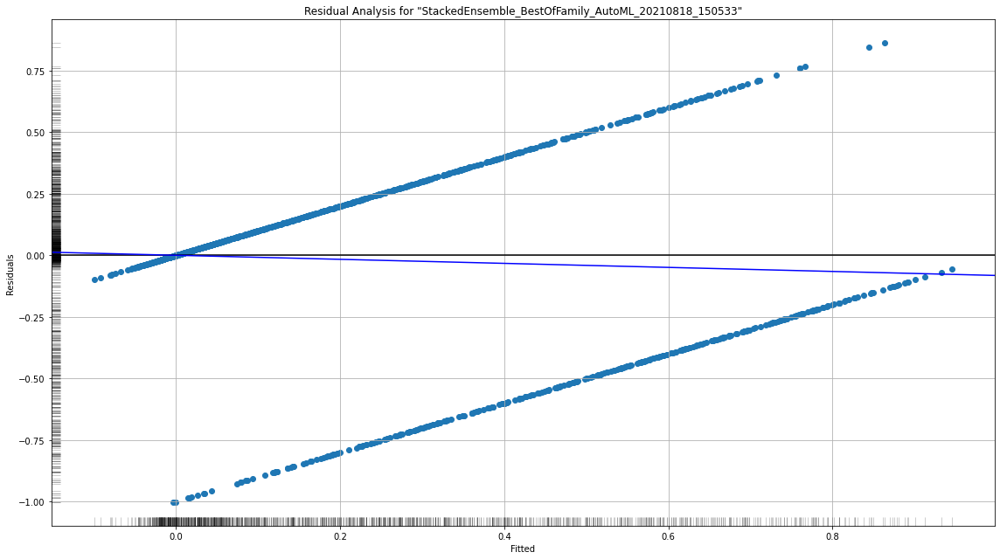

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

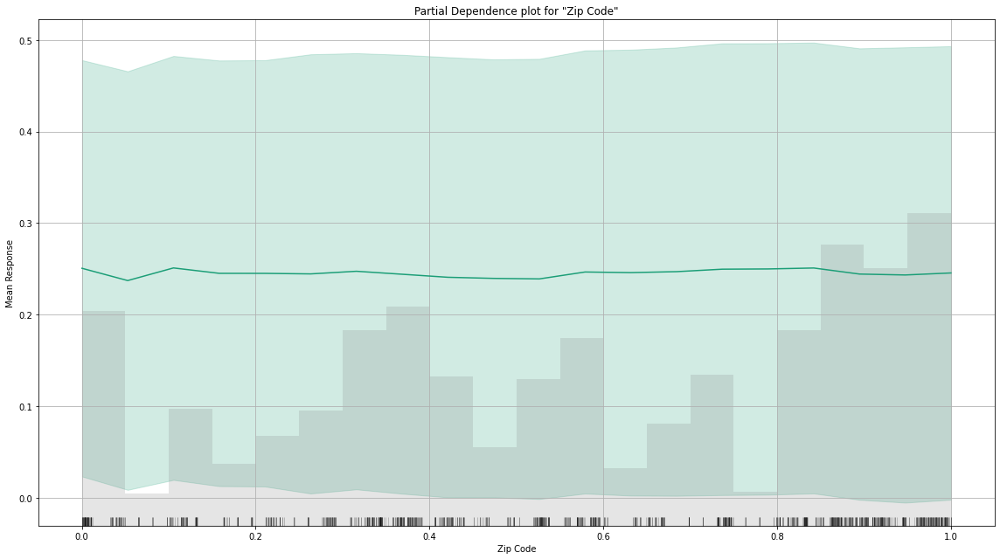

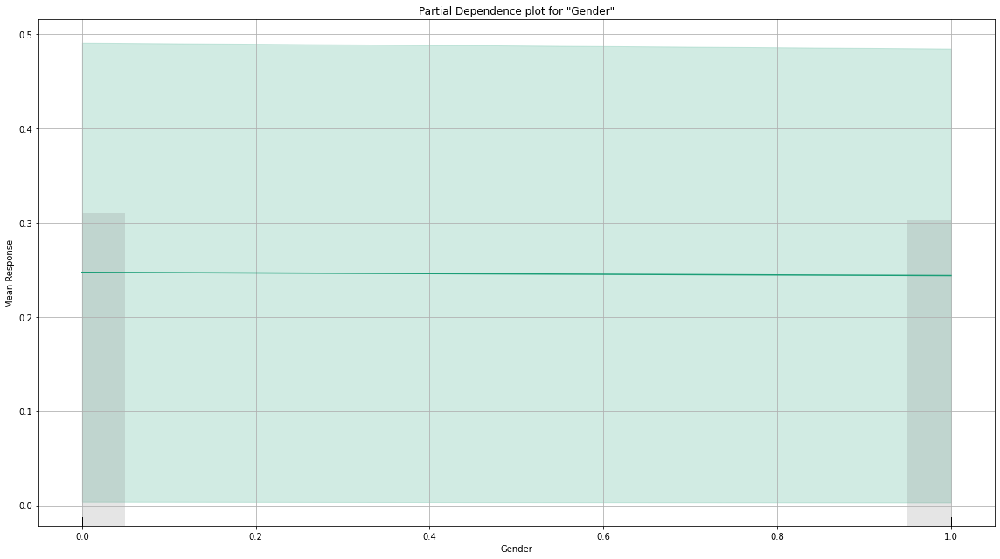

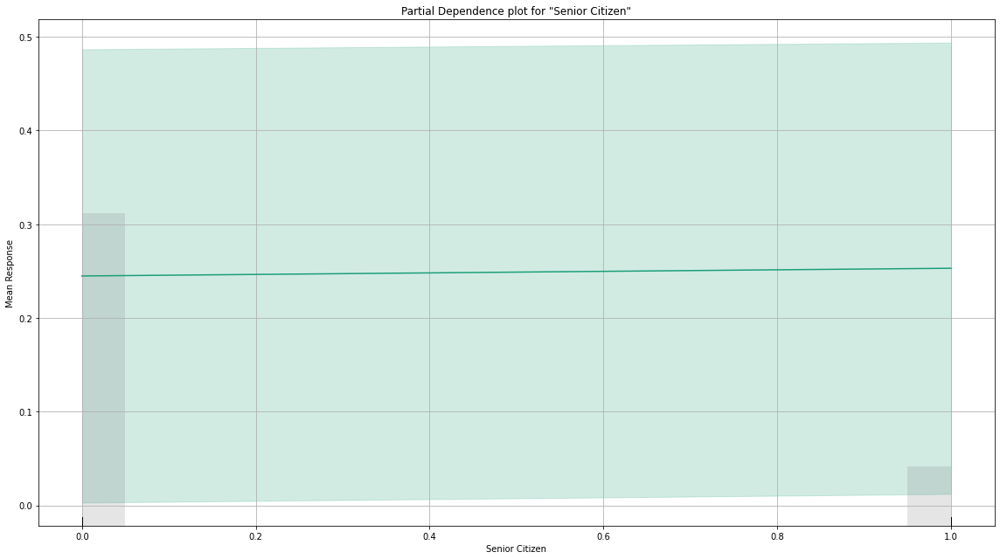

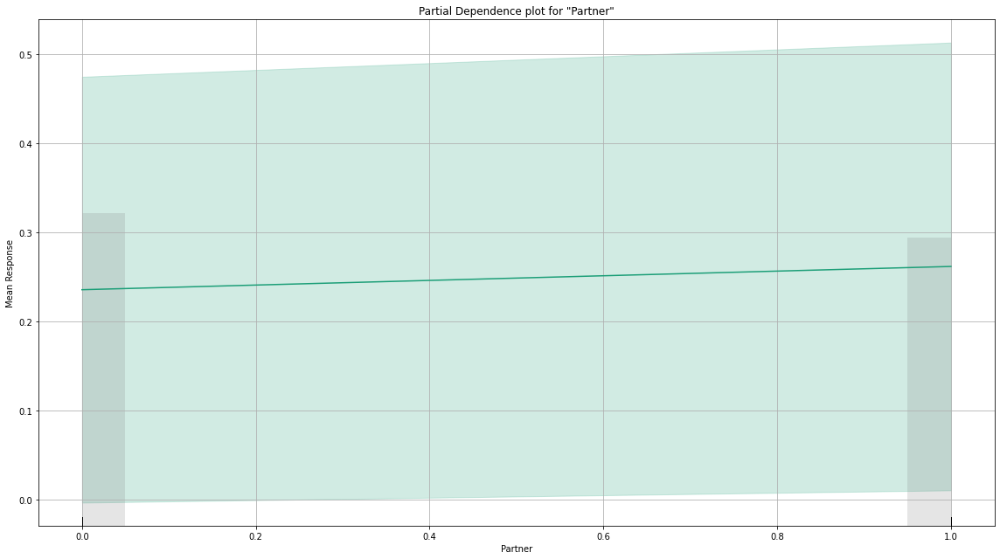

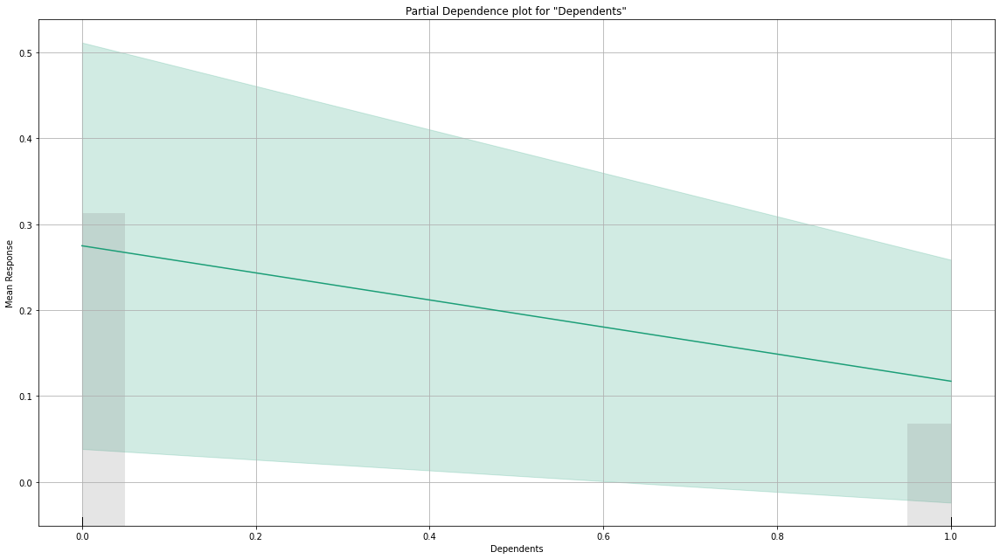

...

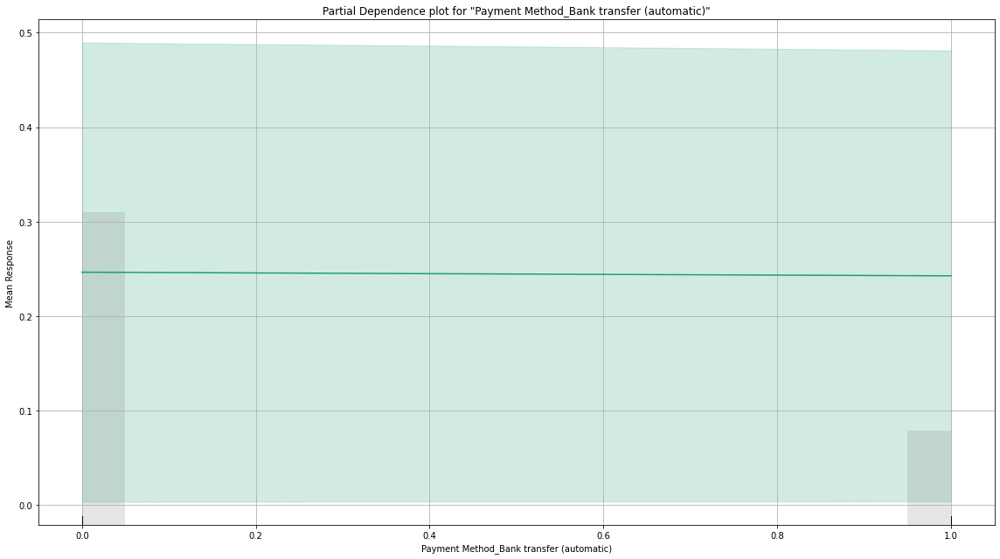

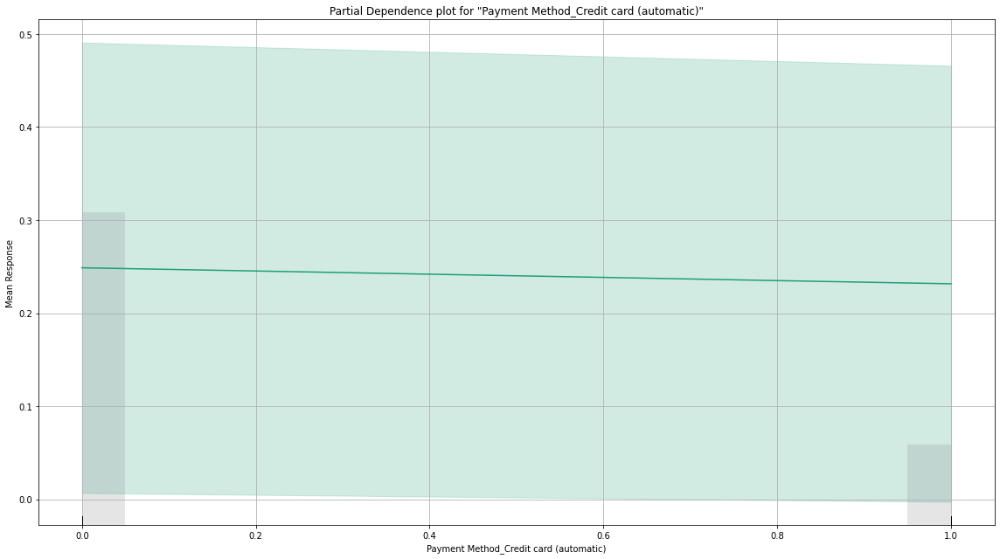

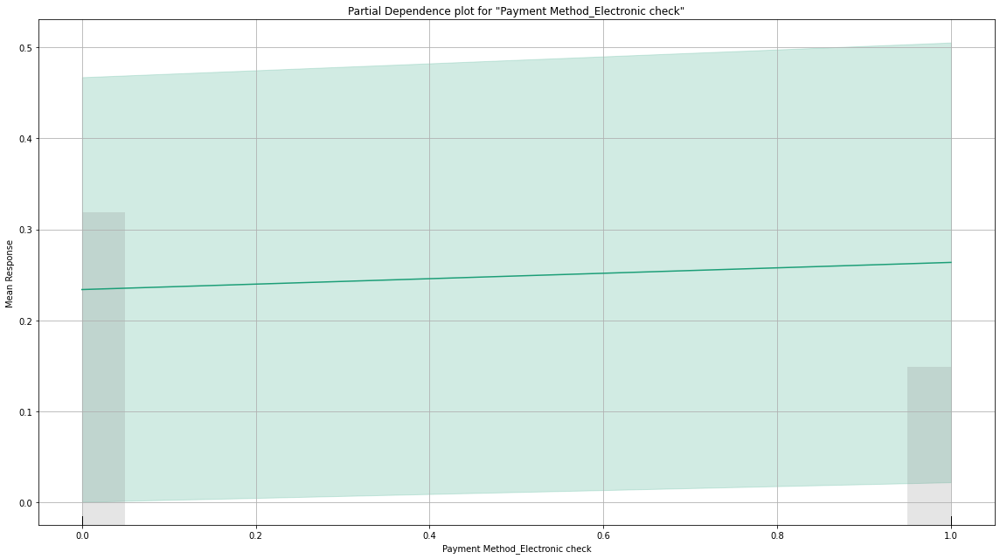

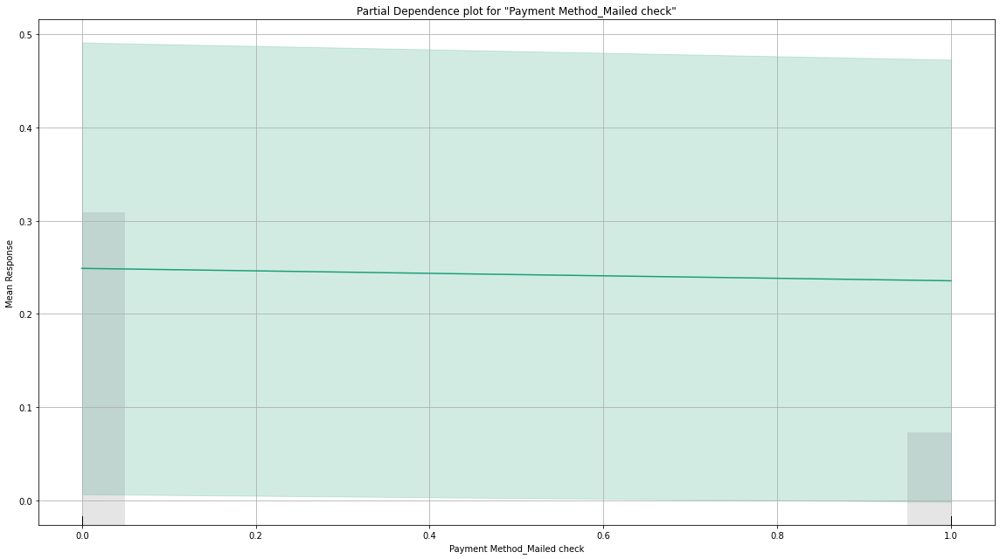

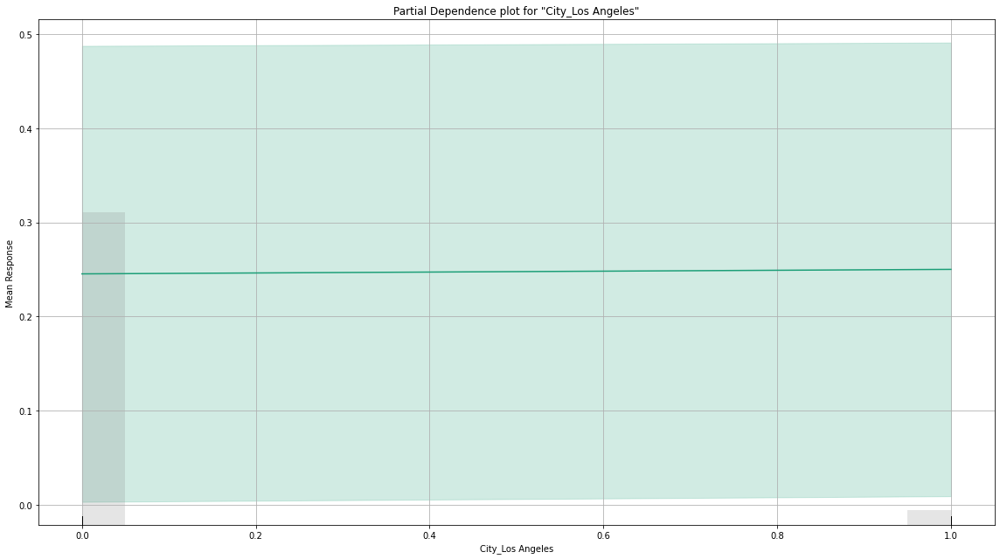

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

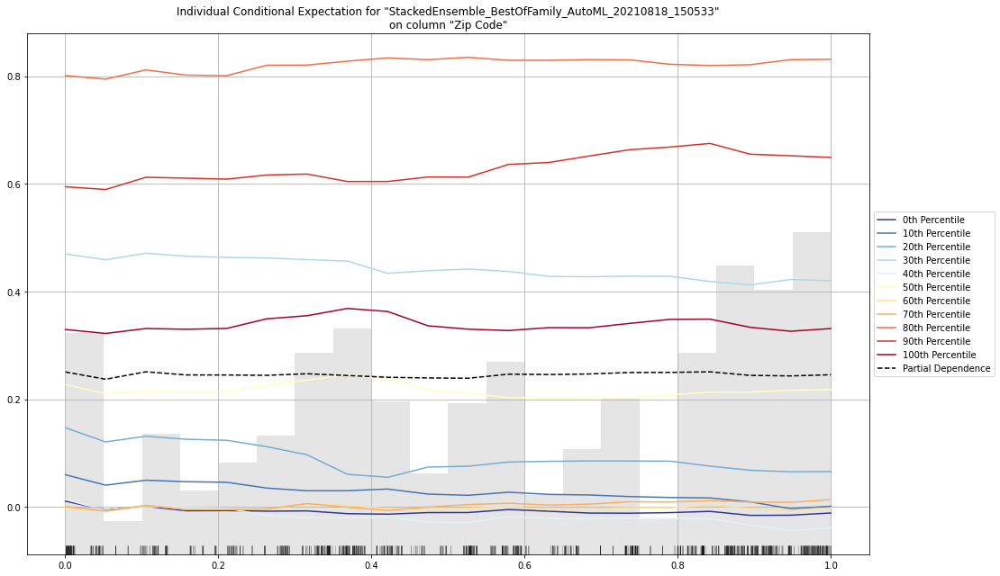

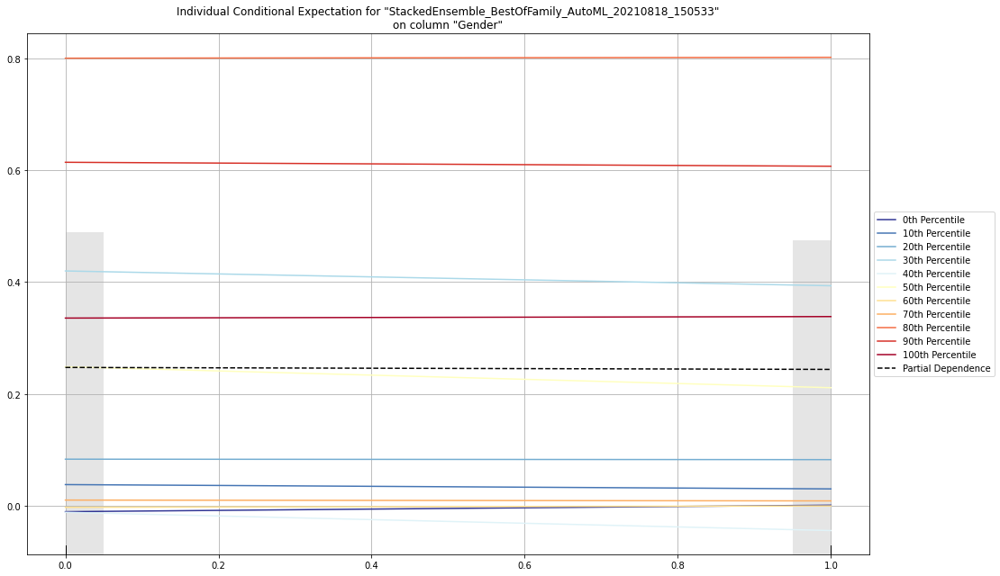

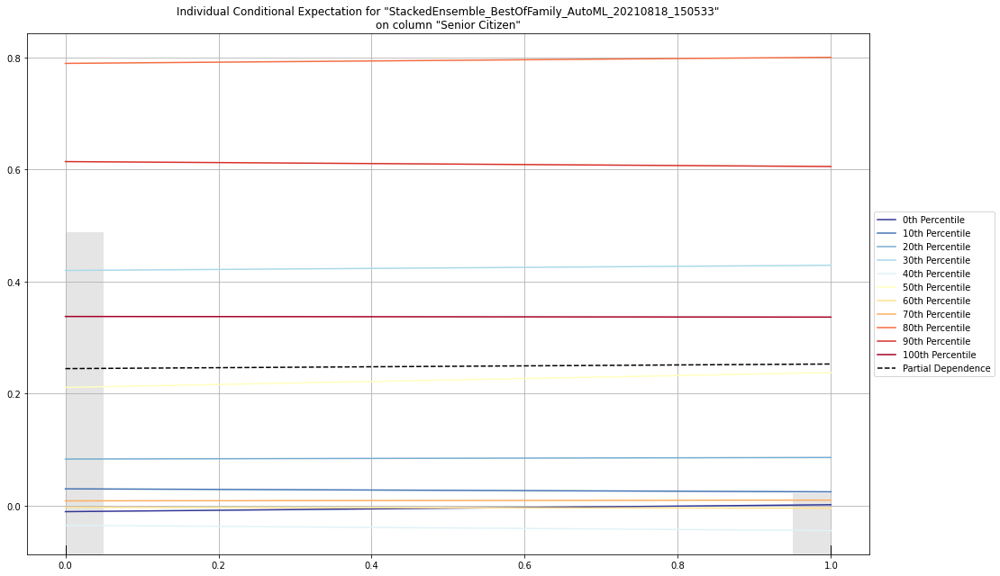

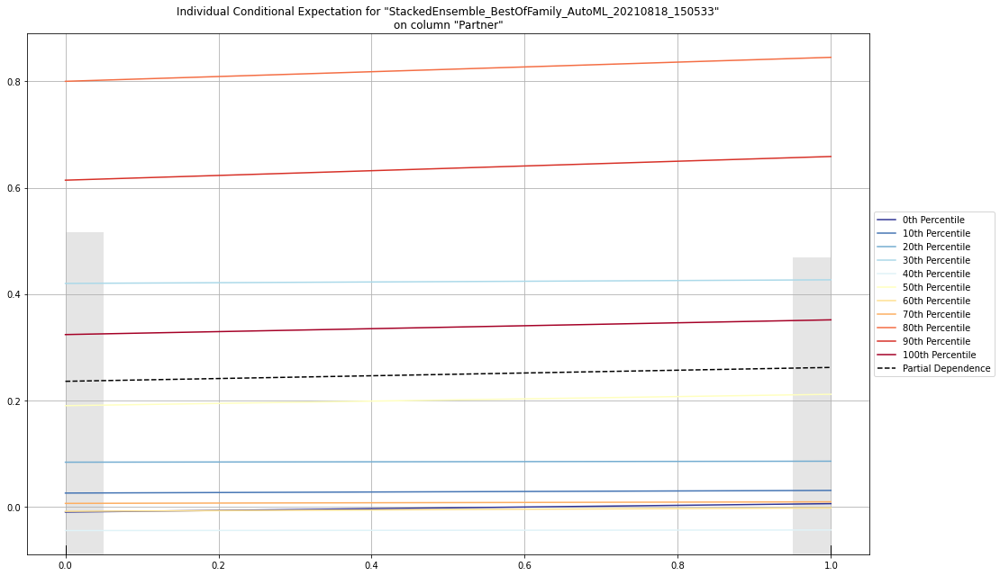

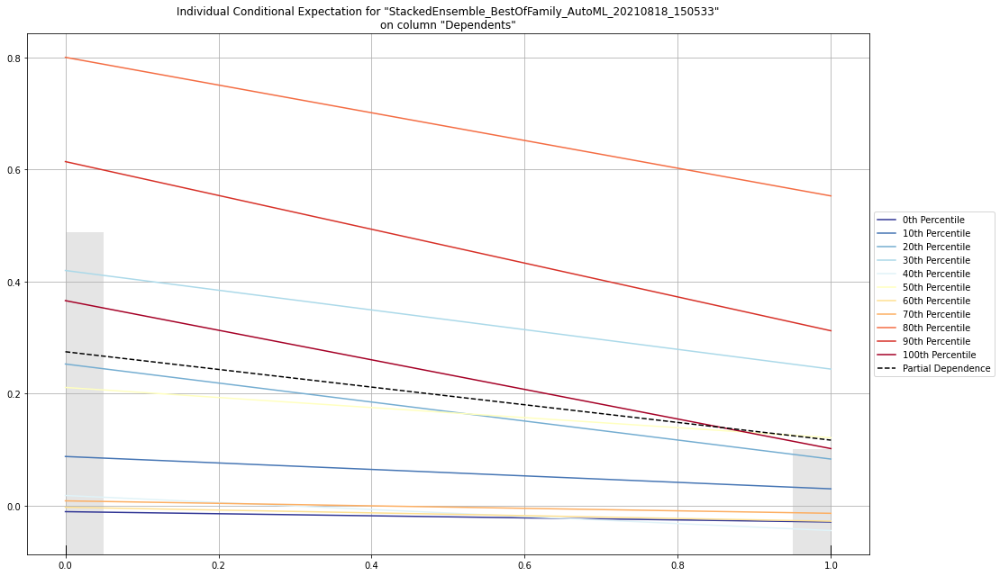

...

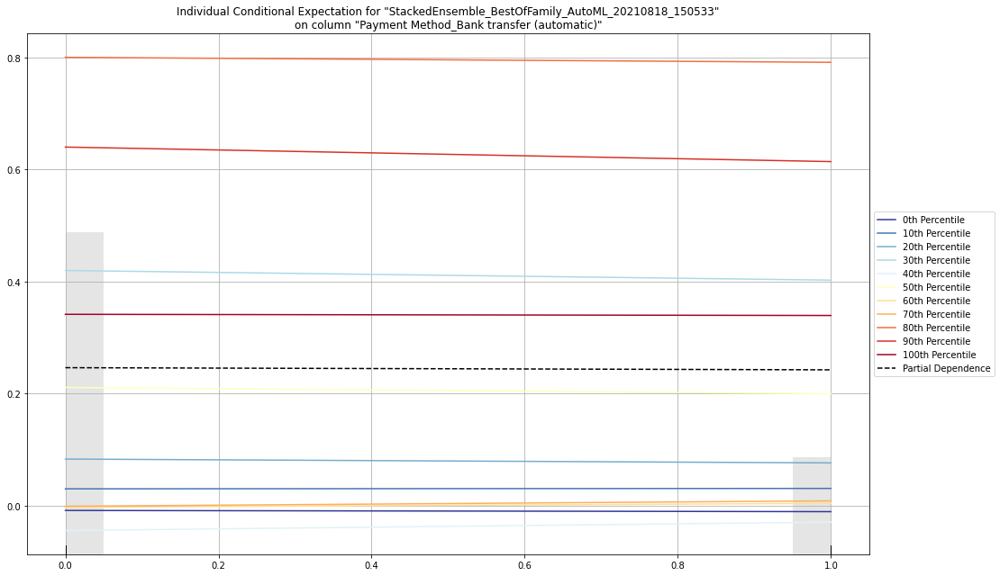

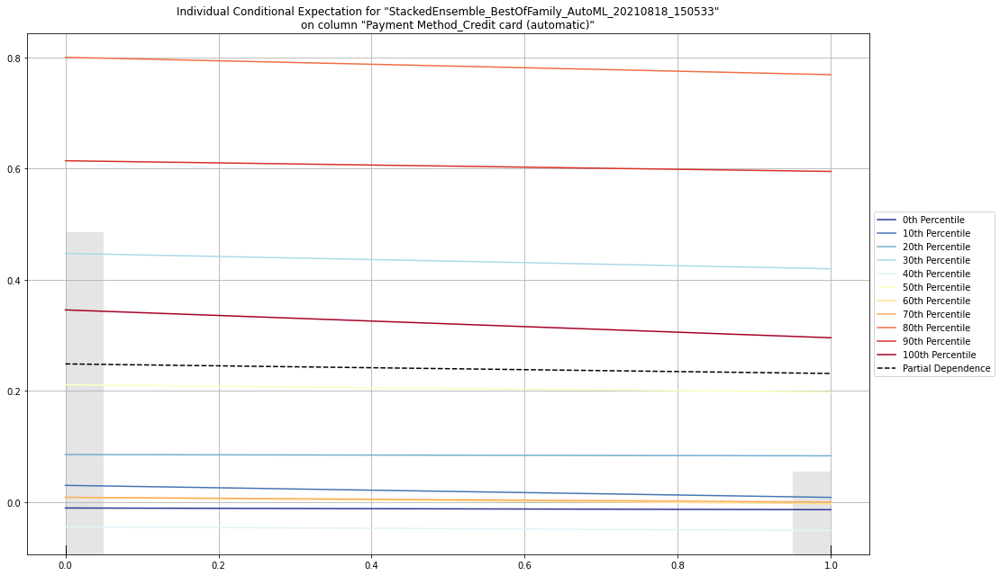

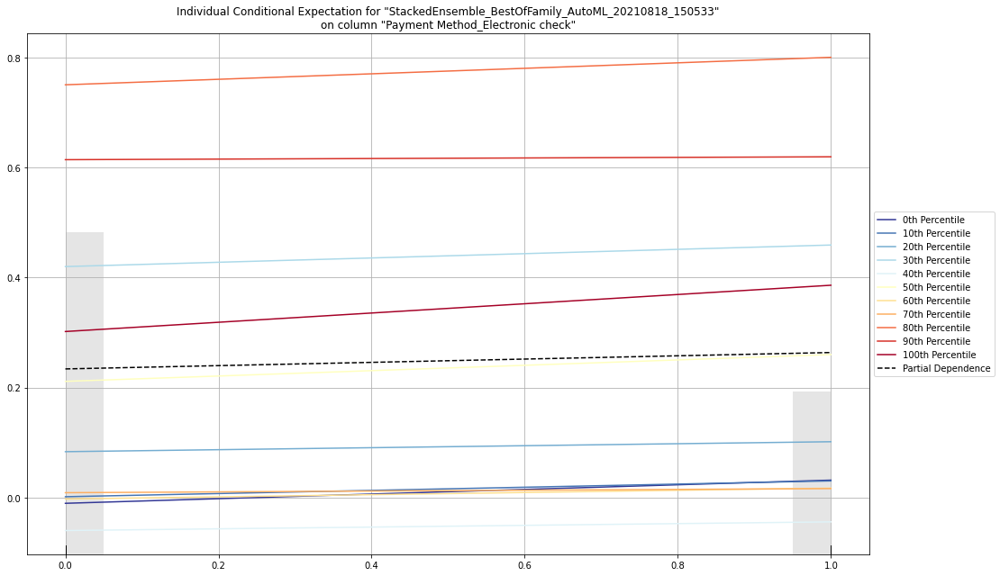

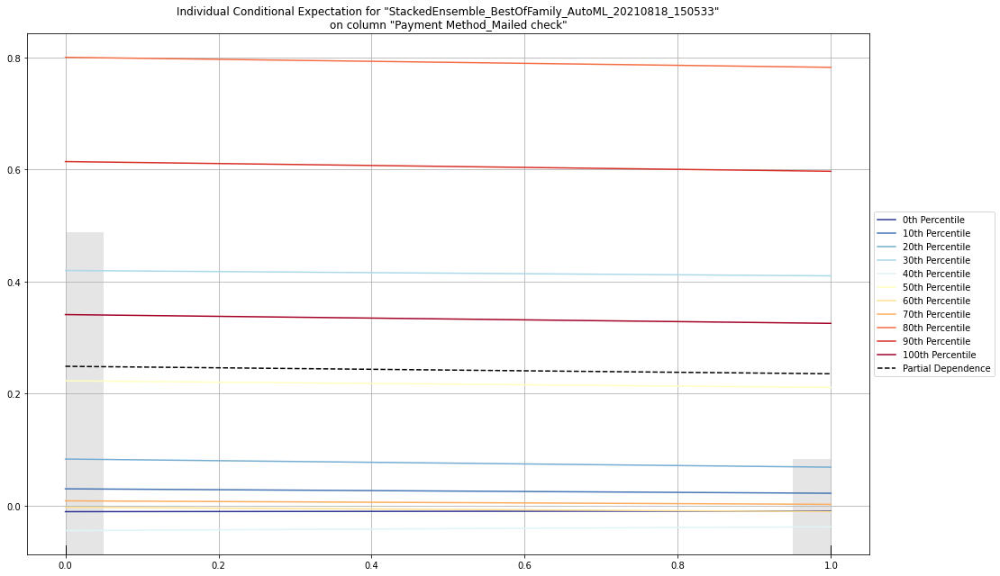

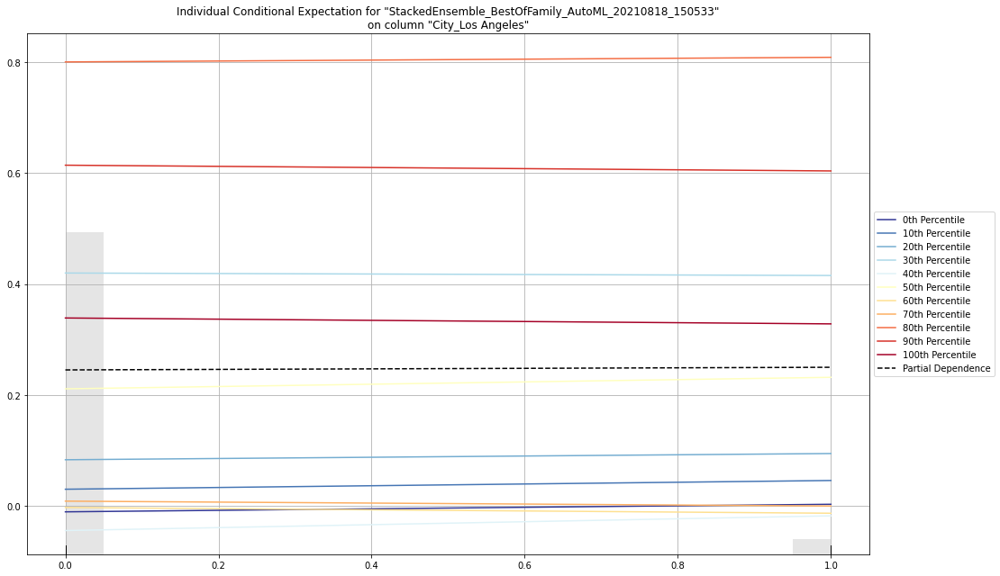

In [131]:
aml.leader.explain(test)

In [7]:
#####################################################
#  Use this section for any idea, observations etc  #
#####################################################

In [50]:
test['predicted_values']=aml.leader.predict(test)

stackedensemble prediction progress: |████████████████████████████████████| 100%


In [51]:
test[test['Churn Value']==1]

Zip Code,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Num_of_services,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check,City_Los Angeles,predicted_values
0.741071,1,1,1,0,0.458333,1,1,0.620398,0.709174,1,0.166667,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0.509628
0.406169,1,0,1,0,0.0277778,1,1,0.558706,0.275834,1,0.166667,1,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0.572942
0.912825,1,0,1,0,0.416667,1,0,0.0139303,0.462563,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0.116014
0.746916,1,0,0,0,0.0138889,1,0,0.60995,0.224791,1,0.166667,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0.828855
0.287175,0,1,1,0,0.222222,1,1,0.800995,0.607934,1,0.5,0,0,1,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0.757108
0.520942,0,0,0,0,0.0138889,1,1,0.273134,0.181324,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0.557459
0.358766,1,0,0,0,0.513889,1,1,0.462687,0.683419,1,0.333333,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0.228739
0.739448,0,0,0,0,0.0277778,1,0,0.521891,0.276743,1,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0.502163
0.385227,1,0,1,0,0.125,1,0,0.708458,0.502394,1,0.333333,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0.645544
0.533442,1,1,0,0,0.0277778,1,1,0.510945,0.270276,1,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0.625034


In [52]:
TEST_DATASET = h2o.as_list(test)

In [53]:
TEST_DATASET['Churn_Pred']= np.where(TEST_DATASET['predicted_values']<=0.5,0,1)

In [54]:
TEST_DATASET

,Zip Code,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Churn Value,Num_of_services,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check,City_Los Angeles,predicted_values,Churn_Pred
0,0.524838,0,0,0,0,1.000000,0,1,0.452239,0.825822,0,1.000000,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,0,0,-0.006513,0
1,0.741071,1,1,1,0,0.458333,1,1,0.620398,0.709174,1,0.166667,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0.509628,1
2,0.911364,1,0,0,0,0.083333,1,1,0.553234,0.395029,0,0.000000,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0.550646,1
3,0.406169,1,0,1,0,0.027778,1,1,0.558706,0.275834,1,0.166667,1,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0.572942,1
4,0.862013,0,0,0,0,0.791667,0,1,0.353234,0.748937,0,0.666667,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0.244176,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1404,0.890260,1,0,1,1,0.722222,1,1,0.325373,0.705527,0,0.166667,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0.002771,0
1405,0.600974,1,1,0,0,0.486111,0,1,0.214925,0.589545,0,0.333333,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0.458999,0
1406,0.292532,0,0,0,1,0.013889,1,1,0.027861,0.130634,0,0.000000,1,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0.210658,0
1407,0.879708,0,0,0,0,0.013889,1,0,0.266667,0.180284,1,0.000000,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0.386299,0


In [55]:
confusion_matrix = confusion_matrix(TEST_DATASET['Churn Value'], TEST_DATASET['Churn_Pred'])
print(confusion_matrix)

[[960  75]
 [172 202]]


Confusion matrix, without normalization
[[960  75]
 [172 202]]
Normalized confusion matrix
[[0.93 0.07]
 [0.46 0.54]]


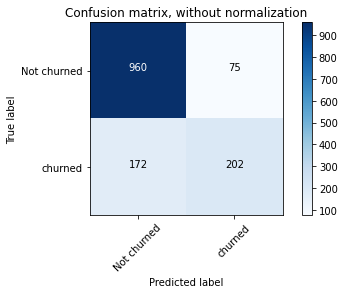

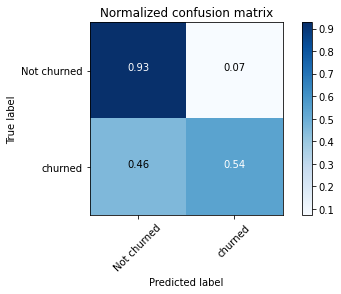

             precision    recall  f1-score   support

Not churned       0.85      0.93      0.89      1035
    churned       0.73      0.54      0.62       374

avg / total       0.82      0.82      0.82      1409



In [56]:
# Confusion matrix
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Compute confusion matrix
cnf_matrix = confusion_matrix(TEST_DATASET['Churn Value'], TEST_DATASET['Churn_Pred'])
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['Not churned','churned']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()


from sklearn.metrics import classification_report
eval_metrics = classification_report(TEST_DATASET['Churn Value'], TEST_DATASET['Churn_Pred'], target_names=class_names)
print(eval_metrics)

In [57]:
 accuracy = accuracy_score(TEST_DATASET['Churn Value'], TEST_DATASET['Churn_Pred'])

In [58]:
print("Accuracy of the Model", round(accuracy,2),"%")

Accuracy of the Model 0.82 %


# 3 5. Sumamry


    - The StackedEnsemble_AllModels_AutoML_20210818_183553(StackedEnsemble) is the best model from the various model that we generated.
    - The Accuracy of the model is 82.47%
    - Month-to-month contract, Tenure Months, Online Security No, Monthly charges are the most important variables contributing to predicting the customer churn
    - We can target the Customers that predicted as churn using the model and prioritized them based on the profit to retrieve them 
    - Create API to integrate with various applications
    - If we do random selection to retrieve the customers then we'll be (374/1035=)36% times accurate but if we use model then accuracy increases to 73%